# <span style="font-family: Arial; font-weight:bold;font-size:1.9em;color:#0e92ea"> Featurisation and Model Tuning Project

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Notebook setup

In [1]:
#Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import copy
import warnings

from scipy import stats 
from scipy.spatial.distance import cdist
from scipy.stats import zscore, skew

In [2]:
# Notebook settings
warnings.filterwarnings("ignore")
%matplotlib inline
sns.set(style="darkgrid")


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Problem description

* <span style="color:#daad86">DOMAIN: <span style="color:#659dbd">Semiconductor manufacturing process
* <span style="color:#daad86">CONTEXT: <span style="color:#659dbd">A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out different combinations of features, essential signals that are impacting the yield type can be identified. 

* <span style="color:#daad86">DATA DESCRIPTION: <span style="color:#659dbd">sensor-data.csv : (1567, 592)
* <span style="color:#bc986a">Attribute Information: 
    - <span style="color:#659dbd">The data consists of 1567 examples each with 591 features.
    - <span style="color:#659dbd">The dataset presented in this case represents a selection of such features where each example represents a single production entity with associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.
    
* <span style="color:#daad86">PROJECT OBJECTIVE: <span style="color:#659dbd">We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the features are required to build the model or not.


### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 1.Import and explore the data

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Import all the given datasets and explore shape and size. 

In [3]:
# Import the dataset named 'Future_predictions.xlxs' and ''
future_prediction = pd.read_csv('./Future_predictions.csv') 
signal_data = pd.read_csv('./signal-data.xls')

print ("The shape and size of  future_predictions are : {} and {} respectively".format(future_prediction.shape, future_prediction.size))
print ("The shape and size of signal_data are : {} and {} respectively".format(signal_data.shape, signal_data.size))

The shape and size of  future_predictions are : (18, 591) and 10638 respectively
The shape and size of signal_data are : (1567, 592) and 927664 respectively


### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 2.Data cleansing

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Missing/incorrect value treatment

In [4]:
#View the first 10 rows of the data
#pd.set_option('display.max_columns', None)
signal_data.head(10)

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5287,...,44.0077,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077,-1
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.5816,...,NaN,0.5010,0.0143,0.0042,2.8515,0.0342,0.0151,0.0052,44.0077,-1
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5153,...,95.0310,0.4984,0.0106,0.0034,2.1261,0.0204,0.0194,0.0063,95.0310,-1
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5358,...,111.6525,0.4993,0.0172,0.0046,3.4456,0.0111,0.0124,0.0045,111.6525,-1
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5381,...,90.2294,0.4967,0.0152,0.0038,3.0687,0.0212,0.0191,0.0073,90.2294,-1


#### Observation: 
<ol>
<li><span style="color:#228B22"> The data has a time stamp colum which has unredable format.
<li><span style="color:#228B22"> Some columns like column 5 and 13 has same value across the rows
<li><span style="color:#228B22"> Few columns are completely empty

In [5]:
#Check the specificaions of each columns
signal_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


#### Observation:  
<ol>
<li><span style="color:#228B22"> All sensor data have float data type  
<li><span style="color:#228B22"> The time stamp column is string data type
<li><span style="color:#228B22"> The Pass/Fail column is integer data type

In [6]:
def missing_check(data):
    total = data.isnull().sum().sort_values(ascending=False)   # total number of null values
    percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)  # percentage of values that are null
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return missing_data.T # return the dataframe
missing_check(signal_data)

,157,292,293,158,85,492,358,220,518,384,...,249,250,251,252,254,255,291,359,360,Time
Total,1429.000000,1429.000000,1429.000000,1429.000000,1341.000000,1341.000000,1341.000000,1341.000000,1018.000000,1018.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,0.911934,0.911934,0.911934,0.911934,0.855775,0.855775,0.855775,0.855775,0.649649,0.649649,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Observation:  
<ol>
<li><span style="color:#228B22"> There missing values in several columns

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Drop attribute/s if required using relevant functional knowledge

In [7]:
#dropping/ignoring time_stamp 
signal_data = signal_data.drop('Time', axis=1)

In [8]:
# dropping missing vlaues columns
signal_data.replace("", np.nan, inplace=True)

signal_data.dropna(how='all', axis=1, inplace=True)

In [9]:
# Identify duplicates records in the data
dupes = signal_data.duplicated()
print ("The number of duplicate records in the data are {}".format(sum(dupes)))

# dropping any duplicates if present 
signal_data = signal_data.drop_duplicates()

The number of duplicate records in the data are 0


##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Make all relevant modifications on the data using both functional/logical reasoning/assumptions.

In [10]:
# replace the missing values with median value.
medianFiller = lambda x: x.fillna(x.median())
signal_data = signal_data.apply(medianFiller,axis=0)

In [11]:
pd.set_option('display.max_columns', None)
missing_check(signal_data)

,Pass/Fail,184,200,199,198,197,196,195,194,193,192,191,190,189,188,187,186,201,202,203,212,218,217,216,215,214,213,211,204,210,209,208,207,206,205,185,183,220,182,163,162,161,160,159,158,157,156,155,154,153,152,151,150,149,164,165,166,175,181,180,179,178,177,176,174,167,173,172,171,170,169,168,219,221,147,258,274,273,272,271,270,269,268,267,266,265,264,263,262,261,260,275,276,277,286,292,291,290,289,288,287,285,278,284,283,282,281,280,279,259,257,222,256,237,236,235,234,233,232,231,230,229,228,227,226,225,224,223,238,239,240,249,255,254,253,252,251,250,248,241,247,246,245,244,243,242,148,146,294,36,52,51,50,49,48,47,46,45,44,43,42,41,40,39,38,53,54,55,64,70,69,68,67,66,65,63,56,62,61,60,59,58,57,37,35,72,34,15,14,13,12,11,10,9,8,7,6,5,4,3,2,1,16,17,18,27,33,32,31,30,29,28,26,19,25,24,23,22,21,20,71,73,145,110,126,125,124,123,122,121,120,119,118,117,116,115,114,113,112,127,128,129,138,144,143,142,141,140,139,137,130,136,135,134,133,132,131,111,109,74,108,89,88,87,86,85,84,83,82,81,80,79,78,77,76,75,90,91,92,101,107,106,105,104,103,102,100,93,99,98,97,96,95,94,293,295,589,480,496,495,494,493,492,491,490,489,488,487,486,485,484,483,482,497,498,499,508,514,513,512,511,510,509,507,500,506,505,504,503,502,501,481,479,516,478,459,458,457,456,455,454,453,452,451,450,449,448,447,446,445,460,461,462,471,477,476,475,474,473,472,470,463,469,468,467,466,465,464,515,517,443,554,570,569,568,567,566,565,564,563,562,561,560,559,558,557,556,571,572,573,582,588,587,586,585,584,583,581,574,580,579,578,577,576,575,555,553,518,552,533,532,531,530,529,528,527,526,525,524,523,522,521,520,519,534,535,536,545,551,550,549,548,547,546,544,537,543,542,541,540,539,538,444,442,296,332,348,347,346,345,344,343,342,341,340,339,338,337,336,335,334,349,350,351,360,366,365,364,363,362,361,359,352,358,357,356,355,354,353,333,331,368,330,311,310,309,308,307,306,305,304,303,302,301,300,299,298,297,312,313,314,323,329,328,327,326,325,324,322,315,321,320,319,318,317,316,367,369,441,406,422,421,420,419,418,417,416,415,414,413,412,411,410,409,408,423,424,425,434,440,439,438,437,436,435,433,426,432,431,430,429,428,427,407,405,370,404,385,384,383,382,381,380,379,378,377,376,375,374,373,372,371,386,387,388,397,403,402,401,400,399,398,396,389,395,394,393,392,391,390,0
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [12]:
#dropping constant columns
signal_data = signal_data.loc[:, (signal_data != signal_data.iloc[0]).any()]
signal_data.shape

(1567, 475)

#### Observation:  
<ol>
    <li><span style="color:#228B22"> All values are replaced with column median
    <li><span style="color:#228B22"> The distribution is slightly narrowed with the median imputation, but the effects are considered negligible. 
    

### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 3.Data analysis & visualisation

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Perform detailed statistical analysis on the data

In [13]:
# Five number summary of the data along with median and IQR
pd.set_option('display.max_columns', None)
median = signal_data.median().rename('median')
IQR = (signal_data.quantile(q=0.75)-signal_data.quantile(q=0.25)).rename('IQR')
pd.concat([signal_data.describe().T, median, IQR], axis=1)

,count,mean,std,min,25%,50%,75%,max,median,IQR
0,1567.0,3014.441551,73.480841,2743.2400,2966.66500,3011.4900,3056.5400,3356.3500,3011.4900,89.87500
1,1567.0,2495.866110,80.228143,2158.7500,2452.88500,2499.4050,2538.7450,2846.4400,2499.4050,85.86000
2,1567.0,2200.551958,29.380973,2060.6600,2181.09995,2201.0667,2218.0555,2315.2667,2201.0667,36.95555
3,1567.0,1395.383474,439.837330,0.0000,1083.88580,1285.2144,1590.1699,3715.0417,1285.2144,506.28410
4,1567.0,4.171281,56.103721,0.6815,1.01770,1.3168,1.5188,1114.5366,1.3168,0.50110
...,...,...,...,...,...,...,...,...,...,...
586,1567.0,0.021458,0.012354,-0.0169,0.01345,0.0205,0.0276,0.1028,0.0205,0.01415
587,1567.0,0.016474,0.008805,0.0032,0.01060,0.0148,0.0203,0.0799,0.0148,0.00970
588,1567.0,0.005283,0.002866,0.0010,0.00330,0.0046,0.0064,0.0286,0.0046,0.00310
589,1567.0,99.652345,93.864558,0.0000,44.36860,71.9005,114.7497,737.3048,71.9005,70.38110


#### Observation: 
<ol>
<li><span style="color:#228B22"> The Pass/Fail column is skewed towards Pass ("-1")

In [14]:
#  Checking the skewness and Kurtosis of data
pd.concat([signal_data.skew().rename('skeweness'), signal_data.kurtosis().rename('kurtosis')], axis=1)

,skeweness,kurtosis
0,0.515100,1.488088
1,-0.043756,2.264880
2,-0.307609,2.352893
3,1.724488,4.670210
4,19.734128,387.952445
...,...,...
586,1.438623,6.982523
587,1.948321,7.099841
588,2.030356,8.246423
589,2.715663,9.818780


#### Observation: 
<ol>
<li><span style="color:#228B22"> Most sensor data columns also have high skeweness and kurtosis


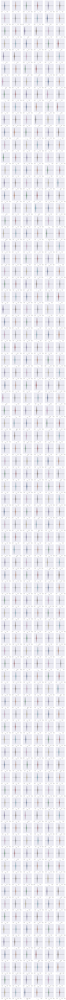

In [15]:
# Visualizing the skeweness more clearly with a vertical mirror image of distribution using the violin plot
fig, axs = plt.subplots(79,6, figsize=(20,4*79))
colors = plt.rcParams["axes.prop_cycle"]()
axs=axs.flatten()
sns.set_color_codes()
for i in range(474):
    sns.violinplot(signal_data.iloc[i], color=next(colors)["color"], ax=axs[i], kde=False);

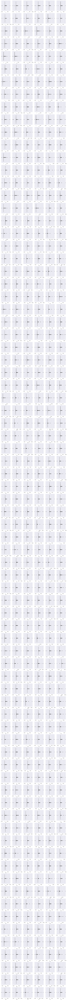

In [16]:
# Checking the presence of outliers
fig, axs = plt.subplots(79,6, figsize=(20,4*79))
colors = plt.rcParams["axes.prop_cycle"]()
axs=axs.flatten()
sns.set_color_codes()
for i in range(474):
    sns.boxplot(signal_data.iloc[i], color=next(colors)["color"], ax=axs[i]);

#### Observation: 
<ol>
<li><span style="color:#228B22"> All ditributions are highly skewed.
<li><span style="color:#228B22"> Several values lie outside the box plot limits indicating outliers 


##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.

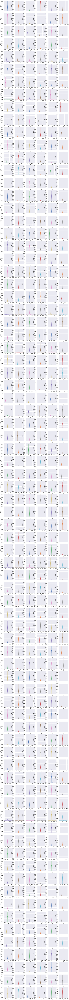

In [17]:
# Checking the univariate distribution of numerical columns
fig, axs = plt.subplots(79,6, figsize=(20,4*79))
colors = plt.rcParams["axes.prop_cycle"]()
axs=axs.flatten()
sns.set_color_codes()
for i in range(474):
    sns.distplot(signal_data.iloc[i], color=next(colors)["color"], ax=axs[i], kde=True);

#### Observation: 
<ol>
<li><span style="color:#228B22"> Since all sensor data has long tails we can try log trasform to see if the distrubution gets more normal

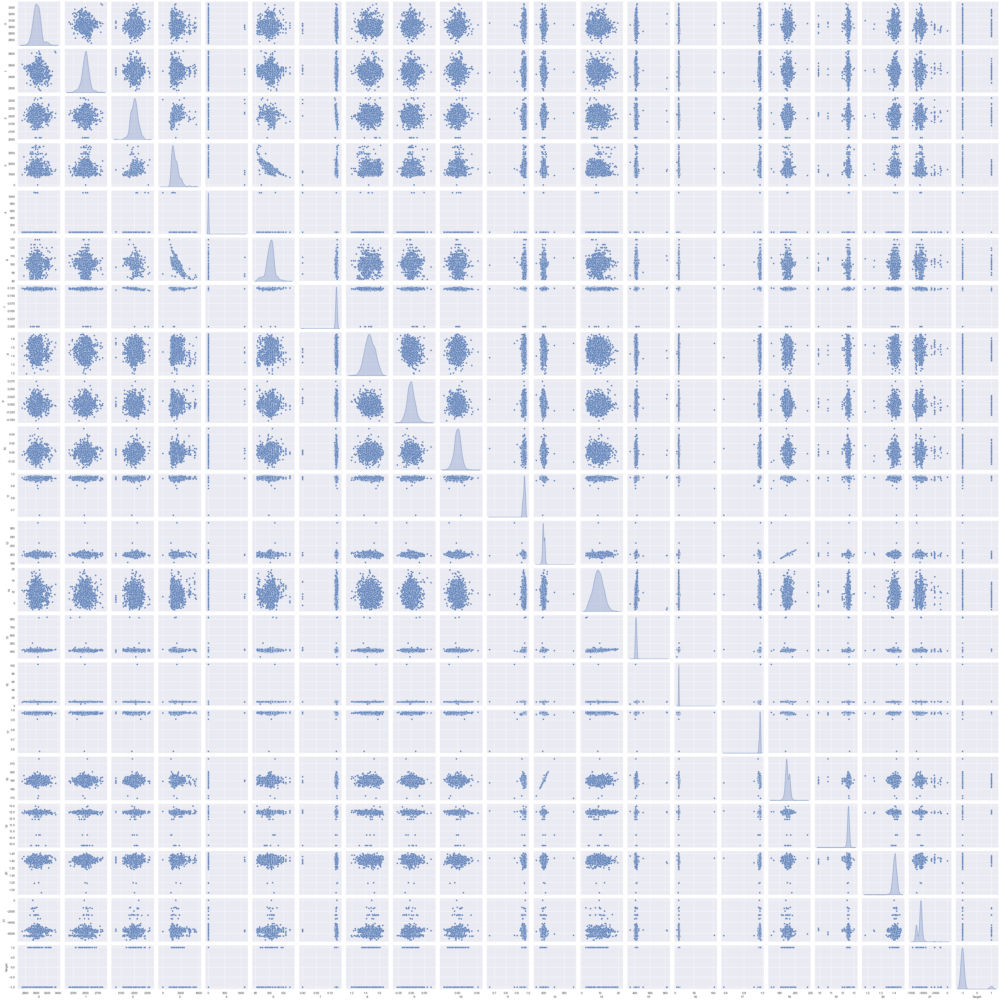

In [18]:
# A Scatter plot gives us an idea of the association between two variables
# Becasue of large number of columns we can perform bi-variate analysis of 20 columns at a time
plot_data = signal_data.iloc[:, 0:20]
plot_data['Target'] = signal_data.iloc[:,474]
sns.pairplot(plot_data, diag_kind='kde');

#### Observation: 
<ol>
<li><span style="color:#228B22"> Some of the sensor data appears to have medium correlated and hence there is scope for dimensionality reduction
<li><span style="color:#228B22"> The target vaiable appears to have weak correlation with many sensor data columns
<li><span style="color:#228B22"> Since traget column is highly skewed we need to attempt upsampling 

In [19]:
# Check the correlation between each attribute
for i in range (0, 440, 20):
    plot_data = signal_data.iloc[:, i:i+20]
    plot_data['Target'] = signal_data.iloc[:,474]
    display(plot_data.corr())
plot_data = signal_data.iloc[:, 460:474]
plot_data['Target'] = signal_data.iloc[:,474]
display(plot_data.corr())

,0,1,2,3,4,6,7,8,9,10,11,12,14,15,16,17,18,19,20,21,Target
0,1.000000,-0.144161,0.004667,-0.006665,-0.010819,0.002028,0.031347,-0.052735,0.009091,0.006445,0.043432,0.010571,-0.007191,0.030745,-0.005720,0.012496,0.017997,-0.009350,0.025773,-0.011373,-0.025100
1,-0.144161,1.000000,0.005883,-0.008963,-0.001917,-0.025222,-0.011761,0.031244,0.024025,0.009529,-0.027042,0.034308,-0.037730,-0.087226,-0.001812,-0.010076,0.043390,-0.003172,0.032532,0.058213,-0.002542
2,0.004667,0.005883,1.000000,0.298810,0.095881,-0.136212,-0.147116,0.023524,0.016248,0.069902,0.036368,0.018359,0.006494,0.006116,-0.000805,-0.004898,0.021890,-0.026671,0.015437,0.044653,-0.000999
3,-0.006665,-0.008963,0.298810,1.000000,-0.058351,-0.685773,0.086965,-0.102839,0.066987,0.049785,0.039943,-0.028949,-0.020144,-0.013440,-0.004475,0.042937,-0.029514,0.040384,0.037980,0.020765,-0.024014
4,-0.010819,-0.001917,0.095881,-0.058351,1.000000,-0.074395,-0.343413,-0.025933,0.053973,-0.006496,-0.001137,-0.002800,-0.017583,0.011395,-0.001730,0.000312,-0.001742,0.007237,0.012824,0.008305,-0.013633
6,0.002028,-0.025222,-0.136212,-0.685773,-0.074395,1.000000,0.009606,0.087803,-0.049039,-0.005373,-0.017991,0.059344,0.055416,0.039898,0.039989,-0.012626,0.033455,-0.006604,-0.035152,-0.021041,0.016085
7,0.031347,-0.011761,-0.147116,0.086965,-0.343413,0.009606,1.000000,0.020122,-0.092130,-0.004349,-0.009556,-0.001707,-0.003499,-0.025130,0.013183,-0.000336,-0.013694,0.202601,0.030716,-0.042791,0.012891
8,-0.052735,0.031244,0.023524,-0.102839,-0.025933,0.087803,0.020122,1.000000,-0.152132,0.058386,-0.065067,0.005459,-0.085782,-0.065712,0.039575,-0.014977,-0.027667,0.013788,-0.039337,0.017408,0.028022
9,0.009091,0.024025,0.016248,0.066987,0.053973,-0.049039,-0.092130,-0.152132,1.000000,-0.064066,-0.008697,-0.065120,-0.004351,0.050255,-0.027479,-0.015727,-0.051904,-0.011518,0.008115,-0.001211,-0.031180
10,0.006445,0.009529,0.069902,0.049785,-0.006496,-0.005373,-0.004349,0.058386,-0.064066,1.000000,-0.021353,-0.052538,-0.077862,-0.004102,-0.062460,-0.032559,-0.008604,-0.027732,0.005708,0.031853,0.033630


,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,Target
22,1.000000,-0.152005,0.119953,0.105645,0.530954,0.095944,-0.065701,0.170606,0.016095,0.419255,0.069729,0.060436,0.039156,0.011905,-0.039157,0.043583,-0.095866,0.037242,-0.014715,0.069125,-0.073646
23,-0.152005,1.000000,0.030025,-0.123945,-0.178551,-0.121141,-0.033920,0.003504,0.014586,-0.007834,-0.011927,-0.020671,0.001314,-0.000066,-0.001314,0.027317,0.017366,0.011089,0.018314,0.007713,0.012850
24,0.119953,0.030025,1.000000,-0.241407,-0.106231,-0.244171,-0.049990,0.011677,-0.087943,0.292632,-0.008774,0.017643,-0.061307,-0.076199,0.061306,-0.006534,-0.040344,-0.030426,0.037224,-0.005509,-0.018129
25,0.105645,-0.123945,-0.241407,1.000000,0.823117,0.980379,0.314311,-0.171053,-0.019262,-0.624439,-0.002927,-0.042218,0.052416,0.044000,-0.052416,-0.095436,-0.208861,0.042574,0.051139,0.010822,-0.035383
26,0.530954,-0.178551,-0.106231,0.823117,1.000000,0.790936,0.187388,-0.002316,0.018653,-0.150921,0.039883,0.001888,0.045834,0.028601,-0.045834,-0.048451,-0.212270,0.027538,0.043624,0.006937,-0.080579
27,0.095944,-0.121141,-0.244171,0.980379,0.790936,1.000000,0.314373,-0.146206,0.002559,-0.649102,0.000952,-0.038505,0.051391,0.047222,-0.051391,-0.076484,-0.194721,0.044571,0.038049,0.008530,-0.028081
28,-0.065701,-0.033920,-0.049990,0.314311,0.187388,0.314373,1.000000,-0.520270,-0.579991,-0.215943,-0.104973,-0.120468,0.004419,0.010084,-0.004418,-0.251289,-0.145649,0.047015,0.177478,-0.045573,-0.106987
29,0.170606,0.003504,0.011677,-0.171053,-0.002316,-0.146206,-0.520270,1.000000,0.858146,0.223702,0.062938,0.037199,-0.038532,-0.046339,0.038532,0.076330,0.038676,-0.048058,-0.002422,0.033260,0.017178
30,0.016095,0.014586,-0.087943,-0.019262,0.018653,0.002559,-0.579991,0.858146,1.000000,-0.043892,0.039333,-0.001848,-0.048825,-0.047245,0.048826,0.032838,0.020463,-0.061722,-0.014052,0.031012,0.037384
31,0.419255,-0.007834,0.292632,-0.624439,-0.150921,-0.649102,-0.215943,0.223702,-0.043892,1.000000,0.064177,0.053960,-0.015237,-0.036134,0.015237,0.098543,0.019304,-0.035090,0.003165,-0.029611,-0.050009


,43,44,45,46,47,48,50,51,53,54,55,56,57,58,59,60,61,62,63,64,Target
43,1.000000,-0.200091,-0.092968,0.475265,0.015356,0.007991,0.641029,0.065586,0.226300,0.208650,0.587778,-0.592906,0.031506,-0.184888,0.070308,0.898199,0.145379,-0.043823,0.159327,-0.050097,-0.020419
44,-0.200091,1.000000,-0.468113,-0.375321,0.199952,0.592597,-0.259233,0.012225,-0.031909,-0.060406,0.034607,0.071362,0.084528,0.062726,0.014378,-0.195023,0.530922,-0.312550,-0.018205,-0.218187,-0.023182
45,-0.092968,-0.468113,1.000000,0.809043,-0.289105,-0.529162,0.564033,0.021744,-0.005227,0.020539,-0.024725,-0.145571,-0.073359,-0.329763,-0.278068,0.104720,-0.664922,0.642336,-0.068568,0.461463,0.008355
46,0.475265,-0.375321,0.809043,1.000000,-0.179441,-0.330496,0.904480,0.120381,0.136885,0.144473,0.344601,-0.479999,-0.033219,-0.422121,-0.220527,0.604511,-0.442756,0.527893,0.053535,0.368122,-0.009410
47,0.015356,0.199952,-0.289105,-0.179441,1.000000,0.640421,0.083783,0.714199,-0.043695,-0.054139,-0.059923,0.013545,0.033767,0.092599,0.101813,-0.088409,0.203447,-0.155155,0.321324,-0.146780,0.028097
48,0.007991,0.592597,-0.529162,-0.330496,0.640421,1.000000,0.048653,0.485046,0.002718,-0.018294,0.123892,0.034824,0.061356,0.180671,0.127773,-0.080094,0.470013,-0.324843,0.258736,-0.242650,-0.015268
50,0.641029,-0.259233,0.564033,0.904480,0.083783,0.048653,1.000000,0.320963,0.159896,0.159561,0.466354,-0.541644,-0.011769,-0.338281,-0.134933,0.701006,-0.252922,0.381665,0.188070,0.255887,-0.015158
51,0.065586,0.012225,0.021744,0.120381,0.714199,0.485046,0.320963,1.000000,-0.047286,-0.058381,0.056700,-0.087912,0.035459,-0.065851,0.020534,0.035458,-0.044892,0.030893,0.296012,-0.007290,0.005932
53,0.226300,-0.031909,-0.005227,0.136885,-0.043695,0.002718,0.159896,-0.047286,1.000000,0.935221,-0.141176,0.441591,0.117965,0.193129,-0.000619,0.231515,-0.014556,0.000490,0.027563,-0.018531,0.006831
54,0.208650,-0.060406,0.020539,0.144473,-0.054139,-0.018294,0.159561,-0.058381,0.935221,1.000000,-0.194546,0.366286,-0.241101,0.161436,-0.024944,0.221080,-0.018688,0.000398,0.031654,0.016711,0.014198


,65,66,67,68,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,Target
65,1.000000,-0.185971,0.181843,-0.010862,-0.040227,-0.014976,-0.058035,0.011968,0.323554,-0.009743,0.069384,-0.047952,-0.028330,0.068373,-0.039538,-0.046768,-0.051338,-0.040240,0.015030,0.064029,0.054961
66,-0.185971,1.000000,0.052310,-0.202909,0.904461,0.089582,0.312200,0.076527,-0.161779,-0.012331,-0.049509,-0.082195,-0.061811,-0.059590,0.062099,-0.044359,-0.070042,0.023838,0.011714,-0.049700,-0.039007
67,0.181843,0.052310,1.000000,-0.460203,0.188115,-0.018656,-0.160288,0.315421,0.073571,0.028279,-0.043226,-0.003934,-0.047562,0.010435,-0.003955,-0.024304,-0.005264,0.010393,0.015076,0.004932,0.039584
68,-0.010862,-0.202909,-0.460203,1.000000,-0.035595,0.096542,-0.040127,-0.051537,-0.058205,-0.028598,0.090437,-0.006704,0.099631,-0.040421,-0.035469,0.063002,-0.010877,0.026050,-0.005984,-0.024033,-0.052117
70,-0.040227,0.904461,0.188115,-0.035595,1.000000,0.100364,0.273771,0.159894,0.009651,-0.018907,-0.020811,-0.096608,-0.057178,-0.052057,0.058622,-0.043137,-0.077943,0.030677,0.020239,-0.054234,-0.052005
71,-0.014976,0.089582,-0.018656,0.096542,0.100364,1.000000,0.063970,-0.032322,0.002399,0.015704,0.118345,-0.057290,0.211421,-0.121621,0.171435,0.024515,-0.060154,0.090633,-0.008907,-0.069174,-0.001984
72,-0.058035,0.312200,-0.160288,-0.040127,0.273771,0.063970,1.000000,-0.837118,-0.052938,-0.004689,-0.038639,-0.028914,0.096009,-0.055376,0.099216,-0.020771,0.054251,0.011842,-0.009400,-0.038574,-0.000051
73,0.011968,0.076527,0.315421,-0.051537,0.159894,-0.032322,-0.837118,1.000000,0.064070,0.016156,-0.001619,-0.003162,-0.103661,0.042840,-0.055946,0.005159,-0.046086,-0.005819,0.007993,0.003683,-0.010158
74,0.323554,-0.161779,0.073571,-0.058205,0.009651,0.002399,-0.052938,0.064070,1.000000,0.019876,0.037887,-0.006184,0.011401,-0.031690,0.008888,0.029376,-0.005281,-0.031998,-0.005561,0.002447,-0.006737
75,-0.009743,-0.012331,0.028279,-0.028598,-0.018907,0.015704,-0.004689,0.016156,0.019876,1.000000,0.139648,0.080941,0.150717,-0.294724,-0.066191,0.020490,0.104405,0.068306,-0.007060,0.016561,0.027830


,86,87,88,89,90,91,92,93,94,95,96,98,99,100,101,102,103,104,105,106,Target
86,1.000000,0.031000,-0.003571,0.077854,-0.040499,-0.049080,0.072215,0.024135,0.012638,-0.016538,-0.011719,-0.007116,-0.011508,0.027558,-0.004706,0.041343,-0.037949,0.014049,-0.072024,-0.022905,0.024974
87,0.031000,1.000000,-0.061580,0.026312,-0.061159,0.016719,-0.029120,0.016805,-0.030068,-0.017937,0.039163,-0.016551,0.041082,-0.039098,-0.015420,0.012667,-0.060690,-0.040373,0.024458,-0.014462,-0.030422
88,-0.003571,-0.061580,1.000000,0.004324,0.035648,0.061554,-0.012966,-0.068687,-0.048736,0.025174,0.051713,-0.047682,-0.008297,-0.019864,-0.045300,-0.020485,0.052217,0.011816,0.014379,0.073157,0.026865
89,0.077854,0.026312,0.004324,1.000000,-0.025338,-0.004474,0.040060,-0.029286,-0.021610,-0.054444,0.031857,-0.056098,-0.001864,0.043275,-0.055000,0.002806,0.019816,0.003056,-0.039658,0.028533,0.030309
90,-0.040499,-0.061159,0.035648,-0.025338,1.000000,-0.001307,-0.061808,-0.015525,-0.016369,0.075810,0.007159,-0.025558,-0.023094,0.038179,-0.020030,-0.003220,0.012147,0.025666,0.062890,0.017024,-0.053443
91,-0.049080,0.016719,0.061554,-0.004474,-0.001307,1.000000,-0.035916,-0.117234,-0.076631,-0.081545,0.099339,-0.083692,0.046683,-0.019844,-0.076791,-0.560102,0.017172,-0.046014,0.031195,0.122965,0.009384
92,0.072215,-0.029120,-0.012966,0.040060,-0.061808,-0.035916,1.000000,0.081877,-0.042124,-0.036251,0.046655,-0.060774,-0.010058,0.027260,-0.051764,0.091377,0.081287,0.003786,-0.988857,-0.088632,-0.008263
93,0.024135,0.016805,-0.068687,-0.029286,-0.015525,-0.117234,0.081877,1.000000,0.012772,0.054798,-0.022386,0.058961,-0.024419,-0.063708,0.039934,0.023357,-0.025645,0.027953,-0.088810,-0.991264,0.031092
94,0.012638,-0.030068,-0.048736,-0.021610,-0.016369,-0.076631,-0.042124,0.012772,1.000000,-0.106733,-0.956990,0.838564,0.055025,0.282190,0.733522,0.004552,-0.012753,-0.051749,0.043436,-0.012234,-0.002659
95,-0.016538,-0.017937,0.025174,-0.054444,0.075810,-0.081545,-0.036251,0.054798,-0.106733,1.000000,-0.030947,0.014973,0.118234,0.032879,0.029063,0.035333,0.239258,-0.120155,0.034555,-0.054831,0.061023


,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,Target
107,1.000000,0.222761,0.004453,-0.019491,0.036896,-0.021885,0.037014,0.003194,-0.093582,-0.000751,0.048779,-0.044679,0.028016,-0.010860,-0.037420,-0.061537,-0.063315,-0.078213,0.004649,-0.014372,-0.015267
108,0.222761,1.000000,0.016459,0.035769,0.038630,-0.009184,-0.008407,0.047914,-0.051158,0.024032,0.052426,-0.055297,0.015010,0.009820,-0.044244,-0.078223,-0.044043,-0.062351,-0.078985,0.045983,0.000710
109,0.004453,0.016459,1.000000,0.211437,0.427133,0.026802,-0.014448,-0.001024,0.005356,0.067680,-0.008823,0.006550,0.022885,0.008188,-0.015627,-0.069853,-0.017130,-0.002679,-0.068939,0.013684,-0.000393
110,-0.019491,0.035769,0.211437,1.000000,-0.440348,-0.104467,0.027785,0.026009,-0.009509,0.066244,0.052072,-0.015392,-0.015098,0.020096,0.121610,-0.105762,0.099200,0.053448,-0.073254,0.092970,0.031694
111,0.036896,0.038630,0.427133,-0.440348,1.000000,0.034752,-0.010803,-0.000295,0.080382,0.017107,-0.009251,-0.017199,0.030492,-0.038302,-0.221799,0.053240,-0.196993,-0.170187,0.072939,-0.097796,-0.067895
112,-0.021885,-0.009184,0.026802,-0.104467,0.034752,1.000000,0.063882,-0.092534,-0.012218,-0.035345,0.004408,0.007038,-0.001961,-0.007491,-0.003921,0.054896,0.010002,0.039307,0.030687,-0.037754,0.028559
113,0.037014,-0.008407,-0.014448,0.027785,-0.010803,0.063882,1.000000,-0.285839,-0.041832,0.056295,0.019973,0.004920,0.025750,-0.064379,0.012697,0.021428,0.036948,-0.035738,0.024316,0.018845,0.001328
114,0.003194,0.047914,-0.001024,0.026009,-0.000295,-0.092534,-0.285839,1.000000,-0.005372,-0.046802,-0.007135,0.028750,-0.034011,0.026087,-0.066527,-0.012332,-0.108043,-0.014537,-0.009576,-0.027923,0.068655
115,-0.093582,-0.051158,0.005356,-0.009509,0.080382,-0.012218,-0.041832,-0.005372,1.000000,0.000273,-0.005960,0.005726,0.042306,-0.020330,-0.039599,-0.003734,-0.028746,-0.048906,0.034944,-0.024656,-0.043654
116,-0.000751,0.024032,0.067680,0.066244,0.017107,-0.035345,0.056295,-0.046802,0.000273,1.000000,-0.070123,-0.026328,-0.010319,-0.033373,0.033244,-0.089236,0.032509,0.011219,-0.088225,0.051575,-0.012912


,127,128,129,130,131,132,133,134,135,136,137,138,139,140,142,143,144,145,146,147,Target
127,1.000000,-0.212765,-0.227739,-0.787261,-0.219375,-0.395763,-0.097017,0.087163,0.048878,-0.014688,-0.028087,-0.087811,0.076837,0.004911,0.016521,-0.044823,0.034366,-0.047246,-0.057887,-0.013341,-0.075128
128,-0.212765,1.000000,0.227594,0.339678,0.105819,0.330921,0.018449,0.032671,-0.005975,-0.048175,-0.031474,0.037419,-0.001375,0.016071,-0.011506,0.059446,0.004803,0.018406,0.018079,-0.019770,0.032053
129,-0.227739,0.227594,1.000000,0.250909,-0.004242,0.129728,-0.030142,-0.056750,0.013851,-0.045236,0.007659,0.087866,-0.071882,0.020440,0.029626,0.047577,-0.071690,0.079585,0.111713,0.061924,0.102799
130,-0.787261,0.339678,0.250909,1.000000,0.200884,0.461618,0.215538,-0.203340,-0.013869,-0.029541,-0.001381,0.064126,-0.072159,-0.028268,-0.038134,0.082628,-0.054509,0.021816,0.012792,0.004396,0.076592
131,-0.219375,0.105819,-0.004242,0.200884,1.000000,0.180242,0.030450,-0.019495,-0.030539,-0.028126,-0.047948,-0.013205,-0.033318,0.028546,0.001526,0.030168,0.005794,-0.027197,-0.027897,-0.053223,0.018018
132,-0.395763,0.330921,0.129728,0.461618,0.180242,1.000000,0.097076,-0.079124,-0.030414,-0.030100,-0.011669,0.134084,-0.126235,-0.026683,-0.050826,0.098892,-0.171343,-0.058502,0.012039,0.004253,0.000523
133,-0.097017,0.018449,-0.030142,0.215538,0.030450,0.097076,1.000000,-0.042675,0.024604,-0.009249,0.013612,0.039081,-0.056386,-0.047581,-0.071704,0.053273,-0.074395,0.011838,0.046497,-0.011145,0.067788
134,0.087163,0.032671,-0.056750,-0.203340,-0.019495,-0.079124,-0.042675,1.000000,-0.024992,0.008056,0.005619,-0.054807,0.061174,0.025018,0.022185,0.026648,0.035056,-0.018403,-0.010545,-0.023224,-0.030327
135,0.048878,-0.005975,0.013851,-0.013869,-0.030539,-0.030414,0.024604,-0.024992,1.000000,-0.106146,-0.087439,-0.034353,0.061301,-0.020613,-0.008095,0.016631,0.030331,0.009220,-0.037194,0.002983,-0.027270
136,-0.014688,-0.048175,-0.045236,-0.029541,-0.028126,-0.030100,-0.009249,0.008056,-0.106146,1.000000,0.664930,-0.014395,0.043265,0.011011,0.062289,-0.030240,-0.000165,0.020080,-0.000600,-0.014068,0.011366


,148,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,Target
148,1.000000,-0.003200,-0.001050,0.991069,0.069231,0.939604,0.000080,0.002126,-0.008542,-0.003515,-0.002952,0.001636,-0.019062,-0.019274,-0.006528,0.000772,-0.003064,0.006052,-0.007425,-0.022322,-0.005593
150,-0.003200,1.000000,0.019085,-0.012872,0.006632,0.021320,-0.001870,0.007781,-0.044429,-0.036942,0.066881,0.019410,-0.052959,-0.000237,0.036107,0.045922,0.041882,0.007788,-0.029461,-0.046067,-0.011994
151,-0.001050,0.019085,1.000000,-0.001345,-0.015350,-0.000205,-0.008608,0.004191,-0.006830,-0.009744,-0.037753,-0.041431,-0.022614,-0.001814,-0.020122,-0.015673,-0.017128,-0.031825,0.011794,0.029704,-0.022364
152,0.991069,-0.012872,-0.001345,1.000000,0.067004,0.887317,-0.005718,0.004860,-0.001405,0.000625,-0.009694,0.001053,-0.014884,-0.019877,-0.010226,-0.003205,-0.006399,0.004496,-0.011160,-0.022790,-0.004594
153,0.069231,0.006632,-0.015350,0.067004,1.000000,0.068661,0.074901,-0.016499,0.032998,-0.000860,0.016011,0.052843,0.005691,-0.065728,0.021619,0.024521,0.030899,-0.019588,-0.070862,-0.078525,0.021757
154,0.939604,0.021320,-0.000205,0.887317,0.068661,1.000000,0.014523,-0.007409,-0.023657,-0.013877,0.030933,0.019966,-0.027671,-0.018543,0.018416,0.027449,0.021970,0.011492,0.002744,-0.019770,0.001583
155,0.000080,-0.001870,-0.008608,-0.005718,0.074901,0.014523,1.000000,-0.003537,-0.005094,-0.004667,0.020482,0.006463,-0.011103,-0.037556,0.016996,0.002515,0.003307,0.005622,0.004409,0.029547,-0.026475
156,0.002126,0.007781,0.004191,0.004860,-0.016499,-0.007409,-0.003537,1.000000,-0.014543,0.009421,-0.022563,-0.029782,-0.004958,0.024466,-0.023755,-0.015076,-0.009578,0.006798,-0.026183,-0.013293,0.002154
157,-0.008542,-0.044429,-0.006830,-0.001405,0.032998,-0.023657,-0.005094,-0.014543,1.000000,-0.031982,-0.011173,0.004018,-0.010730,-0.004001,-0.010089,-0.006612,-0.012861,-0.034777,-0.019453,-0.037575,-0.016089
158,-0.003515,-0.036942,-0.009744,0.000625,-0.000860,-0.013877,-0.004667,0.009421,-0.031982,1.000000,0.004354,-0.004590,-0.032998,0.005989,0.011537,-0.002410,-0.002226,0.005768,-0.001259,-0.022979,0.033269


,169,170,171,172,173,174,175,176,177,180,181,182,183,184,185,187,188,195,196,197,Target
169,1.000000,-0.134635,0.077522,-0.023514,0.016442,-0.023520,0.033164,-0.006877,-0.085103,0.145253,0.037159,0.065590,-0.082052,0.018137,0.000651,0.004016,0.017125,-0.014275,0.029080,0.023645,-0.011276
170,-0.134635,1.000000,-0.147314,0.148416,-0.048526,0.148440,0.231736,0.132228,-0.168530,-0.091448,-0.057536,-0.048431,0.090579,-0.006215,0.018822,0.039051,-0.030875,0.057184,-0.015246,-0.025776,0.036632
171,0.077522,-0.147314,1.000000,0.045043,0.074514,0.045013,-0.005463,0.031589,-0.070036,0.075284,0.065733,0.050137,-0.034097,-0.014229,-0.011052,-0.013203,-0.040415,-0.030790,0.010635,-0.004231,0.003424
172,-0.023514,0.148416,0.045043,1.000000,0.514251,1.000000,0.123478,0.030743,-0.045661,-0.032889,-0.005430,-0.031554,0.064767,-0.020994,-0.012316,0.007378,-0.024607,0.007229,-0.052168,-0.020880,0.037162
173,0.016442,-0.048526,0.074514,0.514251,1.000000,0.514255,-0.008661,-0.006844,-0.099248,0.025052,-0.002132,0.033872,0.040353,0.001771,-0.008228,0.010912,-0.003347,0.031975,-0.055917,-0.027963,-0.007328
174,-0.023520,0.148440,0.045013,1.000000,0.514255,1.000000,0.123512,0.030764,-0.045663,-0.032896,-0.005456,-0.031570,0.064745,-0.021012,-0.012325,0.007366,-0.024589,0.007235,-0.052176,-0.020896,0.037180
175,0.033164,0.231736,-0.005463,0.123478,-0.008661,0.123512,1.000000,0.166915,-0.327899,-0.057233,-0.060640,-0.143501,-0.053645,0.007987,-0.021775,-0.009983,0.052125,0.102360,-0.021732,-0.040817,0.042907
176,-0.006877,0.132228,0.031589,0.030743,-0.006844,0.030764,0.166915,1.000000,-0.449285,-0.036018,0.007225,-0.053621,0.075979,0.013771,-0.000222,0.016956,0.008730,0.047680,-0.008792,-0.005873,-0.014310
177,-0.085103,-0.168530,-0.070036,-0.045661,-0.099248,-0.045663,-0.327899,-0.449285,1.000000,-0.069909,-0.046806,0.011029,-0.012602,-0.039007,-0.032321,-0.017963,0.036527,-0.030599,0.002303,-0.019247,-0.003570
180,0.145253,-0.091448,0.075284,-0.032889,0.025052,-0.032896,-0.057233,-0.036018,-0.069909,1.000000,0.397207,0.266758,-0.101519,0.183622,0.087910,0.063365,-0.113638,-0.130393,0.034614,0.081835,-0.078631


,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,Target
198,1.000000,0.714721,0.508270,0.420631,0.523492,0.582201,0.657287,0.705569,0.138986,0.680626,0.066457,0.138986,-0.026856,-0.005048,-0.015954,0.005509,-0.025305,0.015718,-0.017908,0.005398,0.039895
199,0.714721,1.000000,0.561682,0.509041,0.652016,0.800351,0.827111,0.803850,0.367241,0.879771,0.044207,0.367241,-0.041841,-0.010187,-0.029199,-0.007395,-0.028757,-0.001328,-0.006301,-0.017783,0.052162
200,0.508270,0.561682,1.000000,0.481495,0.672572,0.759035,0.667025,0.497643,0.484091,0.712248,0.046756,0.484091,-0.005365,0.001407,-0.012542,-0.014012,0.012472,0.007399,-0.004196,-0.002095,0.060645
201,0.420631,0.509041,0.481495,1.000000,0.802134,0.560235,0.402503,0.298139,0.589052,0.402696,-0.060620,0.589052,-0.012280,-0.026180,-0.034964,-0.029503,0.031995,0.029574,-0.009198,0.013928,0.029054
202,0.523492,0.652016,0.672572,0.802134,1.000000,0.843598,0.689169,0.520251,0.832281,0.665177,-0.029591,0.832281,-0.014271,0.002754,-0.030698,-0.025245,0.010527,0.026548,-0.014367,0.007661,0.013565
203,0.582201,0.800351,0.759035,0.560235,0.843598,1.000000,0.797242,0.676993,0.682087,0.860641,0.031715,0.682087,-0.015493,0.007063,-0.013629,-0.010416,-0.013100,0.005662,-0.005129,-0.021333,0.045477
204,0.657287,0.827111,0.667025,0.402503,0.689169,0.797242,1.000000,0.834509,0.446667,0.869791,0.051507,0.446667,-0.022867,-0.006695,-0.015987,0.004117,-0.019736,0.003273,-0.023692,-0.010528,0.030377
205,0.705569,0.803850,0.497643,0.298139,0.520251,0.676993,0.834509,1.000000,0.212606,0.872550,0.110370,0.212606,-0.018593,0.003002,-0.011964,0.008427,-0.027252,0.015252,-0.033038,-0.019318,0.053760
206,0.138986,0.367241,0.484091,0.589052,0.832281,0.682087,0.446667,0.212606,1.000000,0.402786,-0.053403,1.000000,0.011729,0.026075,-0.018929,-0.000374,0.008641,0.012389,0.005734,0.004411,-0.006737
207,0.680626,0.879771,0.712248,0.402696,0.665177,0.860641,0.869791,0.872550,0.402786,1.000000,0.085628,0.402786,-0.028297,-0.002282,-0.016785,-0.010169,-0.017630,0.000714,-0.022099,-0.010845,0.035405


,218,219,220,221,222,223,224,225,227,228,238,239,244,245,246,247,248,249,250,251,Target
218,1.000000,-0.036954,-0.011283,-0.008950,-0.009978,-0.017898,-0.031967,0.002530,0.073353,0.033823,0.012573,0.018862,0.003340,-0.006145,0.004461,0.014326,0.008865,-0.012838,-0.012538,-0.007331,-0.014793
219,-0.036954,1.000000,-0.021738,0.029151,-0.000929,-0.017403,-0.030481,0.020946,0.039713,-0.001563,0.022150,-0.029216,-0.005000,0.010480,-0.001941,0.002856,-0.015785,-0.027297,0.057127,-0.007841,0.012486
220,-0.011283,-0.021738,1.000000,0.009501,-0.007184,-0.013780,0.013959,0.016730,-0.013269,0.001550,0.048936,-0.041408,-0.001113,0.019414,0.006108,-0.015828,0.025833,0.021573,0.004303,0.000389,-0.021582
221,-0.008950,0.029151,0.009501,1.000000,0.002410,0.001737,0.040148,0.006727,0.052969,0.020792,0.010996,-0.035637,-0.028902,-0.028030,-0.027365,0.071781,0.019654,0.029204,0.010830,0.060051,0.021609
222,-0.009978,-0.000929,-0.007184,0.002410,1.000000,0.385275,0.018723,-0.006536,0.000317,0.012713,-0.042299,0.031139,-0.003420,-0.009411,-0.006038,-0.011699,0.021707,0.009019,-0.004841,-0.006166,0.031294
223,-0.017898,-0.017403,-0.013780,0.001737,0.385275,1.000000,-0.014137,0.061243,-0.019181,-0.013854,-0.040451,-0.006558,-0.012763,-0.016640,-0.013624,-0.023581,0.000167,-0.016758,0.053448,0.009089,-0.001068
224,-0.031967,-0.030481,0.013959,0.040148,0.018723,-0.014137,1.000000,0.023817,-0.029392,-0.017125,0.033761,-0.006414,0.056413,0.055634,0.058420,-0.009799,0.006654,-0.014953,0.028021,0.009417,0.016091
225,0.002530,0.020946,0.016730,0.006727,-0.006536,0.061243,0.023817,1.000000,0.035790,-0.013079,-0.041948,-0.045378,-0.004697,-0.003862,-0.003715,0.019373,0.059192,0.044173,0.675667,-0.023623,0.020995
227,0.073353,0.039713,-0.013269,0.052969,0.000317,-0.019181,-0.029392,0.035790,1.000000,0.495578,0.015949,-0.010657,-0.018404,-0.022584,-0.018311,0.014616,0.019877,0.038937,0.009618,0.000486,0.041785
228,0.033823,-0.001563,0.001550,0.020792,0.012713,-0.013854,-0.017125,-0.013079,0.495578,1.000000,0.011426,-0.003711,0.002242,0.001332,0.004957,0.022083,-0.005238,0.004909,-0.021554,0.018481,0.011127


,252,253,254,255,267,268,269,270,271,272,273,274,275,277,278,279,280,281,282,283,Target
252,1.000000,0.003799,0.002104,-0.036942,0.019598,0.004142,-0.011371,0.000269,-0.005609,-0.029710,0.001557,-0.004445,-0.000855,-0.000680,-0.023749,-0.026790,-0.006673,-0.021558,-0.009094,-0.003602,-0.006634
253,0.003799,1.000000,-0.049208,-0.059165,-0.013730,0.020888,-0.008467,-0.010378,0.074464,0.047354,0.033456,0.040007,-0.012326,0.008267,-0.057609,0.007980,-0.027097,-0.032678,-0.008099,-0.011120,0.011669
254,0.002104,-0.049208,1.000000,0.141529,-0.071241,0.064158,0.041501,0.042368,-0.003197,-0.044114,-0.005115,-0.022128,0.005980,0.031058,0.056711,-0.046416,0.013097,0.025146,-0.015182,-0.000365,-0.021509
255,-0.036942,-0.059165,0.141529,1.000000,-0.171989,0.089269,0.023495,0.029489,-0.033176,-0.042436,-0.007399,-0.174855,-0.026862,-0.050141,0.098834,-0.084920,0.026089,0.118686,0.033709,0.004074,-0.011730
267,0.019598,-0.013730,-0.071241,-0.171989,1.000000,-0.557621,0.002552,-0.059398,-0.011157,-0.018048,-0.013777,0.123071,0.055687,0.031399,-0.095596,0.040789,-0.028600,-0.027535,-0.052507,-0.034976,-0.014919
268,0.004142,0.020888,0.064158,0.089269,-0.557621,1.000000,-0.018509,0.082909,-0.011054,-0.026516,-0.028037,-0.033733,-0.012415,0.032348,0.125012,0.010898,0.041934,0.010452,0.019341,0.046259,0.007094
269,-0.011371,-0.008467,0.041501,0.023495,0.002552,-0.018509,1.000000,0.019273,-0.039015,-0.019100,-0.022173,0.006162,-0.041726,-0.045040,-0.000457,0.028831,0.018932,0.005010,-0.043486,-0.008608,0.018117
270,0.000269,-0.010378,0.042368,0.029489,-0.059398,0.082909,0.019273,1.000000,-0.109832,-0.100031,-0.040088,0.035149,-0.025979,-0.018844,0.038913,0.019863,-0.004740,-0.037546,-0.023347,0.016652,-0.028204
271,-0.005609,0.074464,-0.003197,-0.033176,-0.011157,-0.011054,-0.039015,-0.109832,1.000000,0.704067,0.015775,0.046063,0.013456,0.052583,-0.019134,0.001103,0.014913,0.004106,-0.010788,-0.021233,0.026911
272,-0.029710,0.047354,-0.044114,-0.042436,-0.018048,-0.026516,-0.019100,-0.100031,0.704067,1.000000,0.031134,0.043808,0.008761,0.037279,-0.039980,-0.021360,0.017427,0.021456,-0.003544,-0.019746,0.030847


,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,Target
285,1.000000,0.004029,-0.015512,0.009694,0.022751,-0.010108,-0.002538,-0.044652,-0.036539,0.066807,0.016208,-0.046174,0.004184,0.035772,0.043148,0.040906,0.016442,-0.025027,-0.037722,-0.001454,-0.012216
286,0.004029,1.000000,-0.000680,-0.015013,-0.000141,-0.011286,0.003061,-0.005939,-0.009588,-0.037799,-0.038127,-0.018293,-0.000131,-0.018636,-0.017003,-0.018253,-0.030527,0.025192,0.038605,0.014745,-0.021145
287,-0.015512,-0.000680,1.000000,0.060007,0.890500,-0.004251,0.008943,-0.001420,-0.000275,-0.009798,0.001310,-0.015190,-0.019641,-0.008600,-0.002459,-0.004521,0.004514,-0.011787,-0.023859,-0.040225,-0.004786
288,0.009694,-0.015013,0.060007,1.000000,0.069038,0.080314,-0.021901,0.035736,-0.001752,0.018750,0.052578,0.005085,-0.066857,0.023638,0.027245,0.032446,-0.027512,-0.067826,-0.072835,-0.116222,0.025270
289,0.022751,-0.000141,0.890500,0.069038,1.000000,0.010480,-0.005603,-0.020691,-0.008870,0.025754,0.020789,-0.022093,-0.020348,0.014789,0.021753,0.018291,0.011257,0.006269,-0.015384,-0.026356,-0.002552
290,-0.010108,-0.011286,-0.004251,0.080314,0.010480,1.000000,-0.005631,-0.002731,-0.002715,0.027879,0.014553,-0.016877,-0.036985,0.014187,0.003674,0.001763,0.005947,0.011553,0.017803,0.000725,-0.014288
291,-0.002538,0.003061,0.008943,-0.021901,-0.005603,-0.005631,1.000000,-0.016103,0.009312,-0.024855,-0.035532,-0.004922,0.024647,-0.027779,-0.020157,-0.015171,0.003133,-0.024594,-0.013660,-0.020846,0.000007
292,-0.044652,-0.005939,-0.001420,0.035736,-0.020691,-0.002731,-0.016103,1.000000,0.021560,-0.013385,0.005940,-0.013871,-0.006861,-0.010874,-0.006953,-0.013119,-0.040545,-0.019584,-0.026377,-0.014627,-0.014586
293,-0.036539,-0.009588,-0.000275,-0.001752,-0.008870,-0.002715,0.009312,0.021560,1.000000,-0.000602,0.003740,-0.026156,-0.006186,0.008853,-0.001395,-0.003176,-0.000823,-0.007603,-0.033896,-0.031486,0.030378
294,0.066807,-0.037799,-0.009798,0.018750,0.025754,0.027879,-0.024855,-0.013385,-0.000602,1.000000,0.593961,0.034417,-0.044551,0.806186,0.834895,0.824398,-0.059148,-0.015075,0.010638,-0.075547,0.081183


,305,306,307,308,309,310,311,312,316,317,318,319,320,321,323,324,331,332,333,334,Target
305,1.000000,-0.161140,0.151895,-0.001157,0.151963,0.251864,0.137737,-0.222296,-0.058494,-0.037489,-0.059359,0.090358,-0.001243,0.028234,0.042725,-0.046582,0.026608,-0.012729,-0.010659,-0.036547,0.020831
306,-0.161140,1.000000,0.030125,0.076943,0.030099,0.032772,0.002809,-0.060429,0.080850,0.061908,0.060925,-0.045808,-0.023237,-0.009700,-0.019470,-0.056987,-0.027340,0.002167,-0.008573,0.038159,0.003368
307,0.151895,0.030125,1.000000,0.529767,0.999999,0.111276,0.022574,-0.053637,-0.010603,-0.010553,-0.041131,0.053370,-0.018321,-0.010773,0.019289,-0.026914,0.009294,-0.032360,-0.020179,-0.006437,0.021862
308,-0.001157,0.076943,0.529767,1.000000,0.529797,0.043087,-0.001708,-0.118273,0.051711,-0.002598,0.022301,0.034217,-0.008174,-0.014046,0.007068,-0.009362,0.054975,-0.052689,-0.029139,0.004533,-0.001630
309,0.151963,0.030099,0.999999,0.529797,1.000000,0.111328,0.022536,-0.053601,-0.010600,-0.010578,-0.041149,0.053366,-0.018346,-0.010787,0.019285,-0.026875,0.009292,-0.032399,-0.020224,-0.006518,0.021838
310,0.251864,0.032772,0.111276,0.043087,0.111328,1.000000,0.209999,-0.415617,-0.043604,-0.048765,-0.097058,-0.044410,0.013148,-0.027365,-0.005737,0.050090,0.088486,-0.017196,-0.037186,-0.069985,0.039503
311,0.137737,0.002809,0.022574,-0.001708,0.022536,0.209999,1.000000,-0.451098,-0.021516,0.003345,-0.061753,0.073888,0.006317,-0.004356,0.018696,0.009611,0.050339,-0.000900,0.003116,-0.014353,-0.018595
312,-0.222296,-0.060429,-0.053637,-0.118273,-0.053601,-0.415617,-0.451098,1.000000,-0.110252,-0.052465,0.000936,-0.002078,-0.036632,-0.030973,-0.013800,0.037412,-0.032623,-0.002864,-0.021434,0.020230,-0.003075
316,-0.058494,0.080850,-0.010603,0.051711,-0.010600,-0.043604,-0.021516,-0.110252,1.000000,0.452469,0.297280,-0.222504,0.150257,0.078546,0.013144,-0.137705,-0.189024,0.022287,0.098558,0.051891,-0.089385
317,-0.037489,0.061908,-0.010553,-0.002598,-0.010578,-0.048765,0.003345,-0.052465,0.452469,1.000000,0.224306,-0.106445,0.348697,0.439187,0.237574,-0.200846,-0.097522,0.042870,0.055797,0.041679,-0.039685


,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,Target
335,1.000000,0.929110,0.441195,0.537676,0.668737,0.791629,0.854251,0.230528,0.918236,0.086812,0.607684,0.527170,0.230528,-0.044609,-0.002067,-0.031736,-0.010873,-0.034173,-0.003951,0.001839,0.034674
336,0.929110,1.000000,0.402934,0.524092,0.653891,0.824410,0.890165,0.202368,0.919632,0.094054,0.614737,0.544982,0.202368,-0.029135,-0.008721,-0.029144,-0.015888,-0.024884,0.010404,-0.006286,0.039689
337,0.441195,0.402934,1.000000,0.756040,0.639461,0.499555,0.417336,0.545192,0.425891,-0.042450,0.142281,0.177359,0.545192,-0.005693,-0.002878,-0.030138,-0.022163,0.028977,0.039394,-0.022959,0.053671
338,0.537676,0.524092,0.756040,1.000000,0.905136,0.587465,0.516764,0.869093,0.592354,-0.018619,0.357332,0.408073,0.869093,-0.012780,0.025843,-0.031348,-0.019722,0.002964,0.026990,-0.006713,0.006930
339,0.668737,0.653891,0.639461,0.905136,1.000000,0.657676,0.606755,0.784512,0.746461,0.025838,0.443069,0.459219,0.784512,-0.019259,0.031917,-0.023975,-0.012914,-0.018557,0.010895,0.014456,0.029923
340,0.791629,0.824410,0.499555,0.587465,0.657676,1.000000,0.888087,0.290276,0.822382,0.079667,0.595396,0.578414,0.290276,-0.031877,-0.000801,-0.015844,0.006700,-0.024688,-0.000760,-0.018723,0.034651
341,0.854251,0.890165,0.417336,0.516764,0.606755,0.888087,1.000000,0.193139,0.879007,0.122848,0.626187,0.573305,0.193139,-0.026620,0.003081,-0.011123,0.007933,-0.030583,0.011189,-0.028328,0.049822
342,0.230528,0.202368,0.545192,0.869093,0.784512,0.290276,0.193139,1.000000,0.289968,-0.051377,0.186862,0.259673,1.000000,0.007142,0.044362,-0.020318,-0.002747,0.003804,0.014367,0.014118,-0.006737
343,0.918236,0.919632,0.425891,0.592354,0.746461,0.822382,0.879007,0.289968,1.000000,0.112635,0.625747,0.557888,0.289968,-0.034008,0.003844,-0.021074,-0.012086,-0.027163,-0.005851,-0.006997,0.030890
344,0.086812,0.094054,-0.042450,-0.018619,0.025838,0.079667,0.122848,-0.051377,0.112635,1.000000,0.146295,0.140059,-0.051377,0.021201,0.014212,0.007706,0.008442,0.010563,0.017383,-0.020164,-0.023049


,355,356,357,358,359,360,361,362,363,365,366,367,368,376,377,382,383,384,385,386,Target
355,1.000000,0.028388,0.000428,-0.014727,0.013730,0.031958,0.027280,0.005471,0.059959,0.074116,-0.012623,0.049120,0.003995,-0.033314,-0.089198,-0.001905,0.001588,-0.008391,0.022154,0.029812,0.009926
356,0.028388,1.000000,-0.041619,0.001808,-0.009282,0.004141,-0.026153,-0.020685,0.008901,0.057708,0.031698,0.048160,0.051707,-0.002684,0.014300,0.008231,-0.001775,0.007712,0.022578,0.017673,-0.009885
357,0.000428,-0.041619,1.000000,-0.035750,0.035238,0.013101,-0.017641,-0.032178,0.049152,0.031652,0.015192,-0.001998,-0.019575,0.012298,-0.047470,-0.006042,0.010011,-0.002830,-0.021118,-0.018222,0.014383
358,-0.014727,0.001808,-0.035750,1.000000,0.004923,-0.006835,0.004473,0.010058,-0.006832,-0.012588,0.011737,-0.014706,0.010500,0.039777,-0.025277,-0.000479,0.009618,0.002665,0.006895,0.011515,-0.005863
359,0.013730,-0.009282,0.035238,0.004923,1.000000,-0.002785,0.000941,0.040667,0.029353,0.060371,0.016899,0.007197,0.008030,-0.019637,-0.039422,-0.030979,-0.026810,-0.028259,0.030359,0.024929,0.033077
360,0.031958,0.004141,0.013101,-0.006835,-0.002785,1.000000,0.357661,0.016899,-0.003498,-0.007325,0.009663,0.003918,-0.011197,-0.036983,0.025238,-0.003312,-0.008780,-0.005275,-0.012679,0.020021,0.038608
361,0.027280,-0.026153,-0.017641,0.004473,0.000941,0.357661,1.000000,-0.011299,0.075678,-0.018842,-0.015771,0.012828,0.008876,-0.040045,-0.009409,-0.006821,-0.010115,-0.005972,-0.009773,0.011926,-0.004971
362,0.005471,-0.020685,-0.032178,0.010058,0.040667,0.016899,-0.011299,1.000000,0.035777,-0.035473,-0.019627,-0.025286,-0.028044,0.036338,-0.007557,0.056023,0.055565,0.058774,-0.003924,0.008881,0.014762
363,0.059959,0.008901,0.049152,-0.006832,0.029353,-0.003498,0.075678,0.035777,1.000000,0.049291,0.002720,0.016399,0.019206,-0.034081,-0.060892,-0.013237,-0.010979,-0.012110,0.028753,0.064742,0.030440
365,0.074116,0.057708,0.031652,-0.012588,0.060371,-0.007325,-0.018842,-0.035473,0.049291,1.000000,0.561574,0.742897,0.607857,0.034208,-0.006028,-0.017397,-0.022540,-0.018920,0.023556,0.014902,0.055197


,387,388,389,390,391,392,393,405,406,407,408,409,410,411,412,413,415,416,417,418,Target
387,1.000000,0.036089,-0.004173,-0.001426,-0.011455,0.039605,0.010770,-0.008815,-0.020097,0.030242,0.011232,-0.001315,-0.024095,-0.012384,0.008617,-0.000013,-0.007264,-0.020207,0.057216,-0.005507,0.066315
388,0.036089,1.000000,-0.029257,0.028533,0.020613,-0.026314,-0.061154,0.042281,-0.007107,-0.010165,-0.027795,0.008764,0.008596,0.030015,0.021436,0.020037,-0.013460,-0.025019,0.010487,-0.019716,0.019723
389,-0.004173,-0.029257,1.000000,0.243617,0.010148,-0.052555,-0.054295,-0.034895,0.043140,-0.000021,-0.008270,-0.013424,-0.000654,-0.028138,-0.031171,0.008690,0.009180,0.021450,0.007625,-0.003702,-0.010372
390,-0.001426,0.028533,0.243617,1.000000,-0.001946,0.004857,-0.037805,0.018326,-0.000050,-0.010653,0.004003,-0.006970,-0.026959,-0.002734,-0.020941,0.002168,0.004910,-0.022615,-0.028935,-0.028017,-0.006805
391,-0.011455,0.020613,0.010148,-0.001946,1.000000,-0.050496,-0.063716,-0.005447,0.020882,-0.000673,-0.005546,0.066223,0.021852,0.017033,0.060287,-0.000764,0.004683,-0.051876,0.012967,-0.027767,0.004288
392,0.039605,-0.026314,-0.052555,0.004857,-0.050496,1.000000,0.179625,-0.079575,0.081245,0.041231,0.008525,0.003944,-0.036922,0.011996,-0.036105,-0.001872,0.027607,0.035722,-0.053647,0.000840,-0.021268
393,0.010770,-0.061154,-0.054295,-0.037805,-0.063716,0.179625,1.000000,-0.168122,0.088428,0.008205,0.021238,-0.034114,-0.039294,0.034534,-0.153558,-0.036259,-0.060263,0.022668,-0.117048,0.003128,-0.003346
405,-0.008815,0.042281,-0.034895,0.018326,-0.005447,-0.079575,-0.168122,1.000000,-0.611932,0.011806,-0.034531,-0.020233,-0.012698,-0.002369,0.038282,0.083946,0.033751,-0.009564,0.057993,-0.001620,-0.012873
406,-0.020097,-0.007107,0.043140,-0.000050,0.020882,0.081245,0.088428,-0.611932,1.000000,-0.015705,0.057271,-0.019753,-0.028572,-0.067592,0.029007,-0.056313,0.029040,0.038699,-0.025769,0.014528,0.023252
407,0.030242,-0.010165,-0.000021,-0.010653,-0.000673,0.041231,0.008205,0.011806,-0.015705,1.000000,0.008742,-0.040201,-0.005153,-0.032286,-0.013343,-0.043741,-0.050007,-0.010919,0.021426,0.050033,0.021154


,419,420,421,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,Target
419,1.000000,-0.012531,0.007148,-0.007394,0.021961,-0.000162,-0.029979,0.016453,0.009653,0.018324,0.012667,0.036151,0.013818,-0.000980,0.025814,0.026174,0.028707,-0.027241,-0.029682,-0.037863,0.014290
420,-0.012531,1.000000,0.895897,0.000422,-0.004045,0.880402,0.429976,0.830879,0.017287,-0.005707,0.003779,0.015728,-0.008721,-0.048055,0.010521,0.009898,0.011259,-0.005025,-0.038718,-0.050855,0.006996
421,0.007148,0.895897,1.000000,-0.005574,-0.000706,0.954595,0.066083,0.966962,0.000770,0.000041,0.001198,0.002561,-0.020791,-0.027041,0.001737,0.002696,0.003100,0.006071,-0.006990,-0.019421,-0.005185
423,-0.007394,0.000422,-0.005574,1.000000,0.152127,-0.015562,0.018601,0.011790,-0.025829,0.014095,0.047312,0.048165,-0.025406,0.014593,0.035323,0.040743,0.035395,-0.014099,0.078705,0.080872,0.048021
424,0.021961,-0.004045,-0.000706,0.152127,1.000000,-0.006258,-0.012127,0.000159,-0.009076,0.005813,-0.024712,-0.028291,-0.029301,0.008154,-0.013800,-0.012460,-0.011652,-0.024250,0.001623,0.006417,-0.022805
425,-0.000162,0.880402,0.954595,-0.015562,-0.006258,1.000000,0.070741,0.876431,-0.008744,0.010813,0.012712,0.023269,0.006045,-0.032348,0.017800,0.017983,0.018762,0.006107,-0.029245,-0.035821,0.013891
426,-0.029979,0.429976,0.066083,0.018601,-0.012127,0.070741,1.000000,0.063815,0.063996,-0.015204,0.014878,0.035265,0.009373,-0.073117,0.024092,0.019757,0.024794,-0.008038,-0.075492,-0.070574,0.020597
427,0.016453,0.830879,0.966962,0.011790,0.000159,0.876431,0.063815,1.000000,0.009038,-0.008268,0.024170,0.020448,-0.028392,-0.028039,0.019172,0.020625,0.021285,0.010041,0.002377,-0.017484,0.000770
428,0.009653,0.017287,0.000770,-0.025829,-0.009076,-0.008744,0.063996,0.009038,1.000000,-0.001324,0.000646,-0.003478,-0.032053,-0.031301,-0.003914,-0.007644,-0.007777,0.004680,0.006750,0.019023,-0.026468
429,0.018324,-0.005707,0.000041,0.014095,0.005813,0.010813,-0.015204,-0.008268,-0.001324,1.000000,-0.019523,-0.024525,0.046659,0.011440,-0.017115,-0.014971,-0.013699,0.008859,-0.036129,-0.021452,0.000275


,440,441,442,443,444,445,446,447,448,452,453,454,455,456,457,459,460,467,468,469,Target
440,1.000000,-0.133037,0.093142,-0.027924,0.007965,-0.021037,0.040081,-0.011673,-0.079653,0.144765,0.028913,0.052947,-0.088696,0.005683,-0.003241,0.000819,-0.010446,-0.009129,0.080600,0.022558,-0.007244
441,-0.133037,1.000000,-0.123897,0.168132,-0.020454,0.162771,0.240536,0.131905,-0.177448,-0.088261,-0.055799,-0.038905,0.095730,-0.003913,0.016151,0.039406,0.005831,0.056838,-0.032748,-0.030098,0.033248
442,0.093142,-0.123897,1.000000,0.057596,0.083982,0.057192,-0.027622,0.032527,-0.057149,0.092605,0.072924,0.038930,-0.035569,0.004245,-0.005464,-0.011169,-0.002598,-0.034605,0.017136,-0.021376,-0.013373
443,-0.027924,0.168132,0.057596,1.000000,0.538912,0.991491,0.120939,0.027537,-0.040369,-0.033698,-0.004088,-0.030724,0.064637,-0.017292,-0.009044,0.008580,-0.009666,0.007085,-0.009755,-0.022018,0.036750
444,0.007965,-0.020454,0.083982,0.538912,1.000000,0.511366,-0.010112,-0.003168,-0.093985,0.021358,-0.001951,0.039766,0.039676,-0.002151,-0.006036,0.012279,-0.011689,0.034236,0.050546,-0.032145,-0.006723
445,-0.021037,0.162771,0.057192,0.991491,0.511366,1.000000,0.129344,0.035305,-0.038812,-0.031459,-0.000821,-0.030864,0.066121,-0.015330,-0.008751,0.007929,-0.003520,0.007370,-0.008271,-0.017985,0.037740
446,0.040081,0.240536,-0.027622,0.120939,-0.010112,0.129344,1.000000,0.168332,-0.330327,-0.043515,-0.062228,-0.132729,-0.045952,-0.005020,-0.028891,-0.006680,0.036369,0.102526,-0.032372,-0.034441,0.041570
447,-0.011673,0.131905,0.032527,0.027537,-0.003168,0.035305,0.168332,1.000000,-0.453641,-0.034339,0.008953,-0.051512,0.077194,0.009208,0.000526,0.018112,0.017171,0.049322,-0.009624,-0.004510,-0.014787
448,-0.079653,-0.177448,-0.057149,-0.040369,-0.093985,-0.038812,-0.330327,-0.453641,1.000000,-0.072544,-0.045259,0.015399,-0.015183,-0.038028,-0.036607,-0.019258,-0.041298,-0.030660,-0.068021,-0.019119,-0.003485
452,0.144765,-0.088261,0.092605,-0.033698,0.021358,-0.031459,-0.043515,-0.034339,-0.072544,1.000000,0.373513,0.255878,-0.057913,0.215590,0.115449,0.083531,0.113423,-0.117324,0.103203,0.060880,-0.077085


,470,471,472,473,474,475,476,477,478,479,480,482,483,484,485,486,487,488,489,490,Target
470,1.000000,0.649887,0.103039,0.321759,0.458086,0.537959,0.503656,0.677252,0.134501,0.666475,0.073240,0.030111,-0.046462,-0.001216,0.028252,-0.001591,0.011904,-0.035870,0.025036,-0.044116,0.038501
471,0.649887,1.000000,0.184058,0.517323,0.653896,0.797319,0.391090,0.638670,0.505347,0.759730,0.011727,0.022792,-0.034630,-0.007940,0.064992,0.028062,-0.006955,-0.044304,0.004369,-0.023127,0.059863
472,0.103039,0.184058,1.000000,0.265153,0.261966,0.307825,0.133892,0.051587,0.188494,0.255936,0.107291,0.002813,-0.000050,0.009581,0.005862,0.017485,0.046084,-0.018501,0.013428,-0.006693,0.001210
473,0.321759,0.517323,0.265153,1.000000,0.786294,0.358197,0.129411,0.151737,0.360450,0.258799,-0.066516,-0.005900,-0.049086,-0.028112,0.084987,-0.014178,0.038216,-0.030958,-0.003623,-0.049277,0.009775
474,0.458086,0.653896,0.261966,0.786294,1.000000,0.544899,0.242972,0.504636,0.385577,0.567730,-0.074473,-0.014830,-0.009598,-0.023302,0.060929,-0.016867,0.021714,-0.025368,0.006099,-0.045294,0.015020
475,0.537959,0.797319,0.307825,0.358197,0.544899,1.000000,0.293547,0.630957,0.726027,0.854947,0.052837,-0.007307,0.006096,0.018793,0.035948,0.038591,-0.032535,-0.034608,0.000366,0.006325,0.044459
476,0.503656,0.391090,0.133892,0.129411,0.242972,0.293547,1.000000,0.529747,-0.034097,0.417113,0.574931,0.054158,-0.100734,0.062545,0.001109,0.025386,-0.052486,-0.017949,0.017644,0.012548,0.028827
477,0.677252,0.638670,0.051587,0.151737,0.504636,0.630957,0.529747,1.000000,0.175747,0.865124,0.167571,0.025186,-0.043797,0.042136,0.005911,0.012905,-0.027233,-0.016570,0.012084,-0.013475,0.056275
478,0.134501,0.505347,0.188494,0.360450,0.385577,0.726027,-0.034097,0.175747,1.000000,0.428807,-0.044200,-0.028829,0.027032,-0.002985,0.064941,0.009026,-0.022891,-0.035632,-0.030300,0.002403,-0.006737
479,0.666475,0.759730,0.255936,0.258799,0.567730,0.854947,0.417113,0.865124,0.428807,1.000000,0.116749,0.017217,-0.027852,0.022370,0.019234,0.033516,-0.021678,-0.024492,0.025361,-0.006469,0.039818


,491,492,493,494,495,496,497,499,500,510,511,516,517,518,519,520,521,522,523,524,Target
491,1.000000,-0.022598,0.029990,0.001274,-0.013772,-0.018100,0.023253,0.026990,-0.002451,-0.002084,-0.013147,-0.007488,0.005873,-0.004813,-0.004518,-0.016905,-0.030410,0.061538,-0.007233,-0.022700,0.014320
492,-0.022598,1.000000,0.008453,-0.004704,-0.015118,0.013198,0.020625,0.027921,-0.033056,0.003259,-0.015256,-0.000956,0.014628,0.005034,-0.005256,0.027562,0.037803,0.005123,0.001251,-0.001535,-0.017241
493,0.029990,0.008453,1.000000,-0.000512,0.005369,0.026697,0.010001,-0.025871,0.050717,0.074594,0.003556,-0.028647,-0.029040,-0.027178,0.057574,0.018207,0.092248,0.013016,0.060296,0.012379,0.019420
494,0.001274,-0.004704,-0.000512,1.000000,0.380318,0.018855,-0.009789,-0.046019,0.043569,-0.020925,0.000523,-0.003153,-0.008202,-0.005468,-0.009286,0.018940,0.009772,-0.003270,-0.005949,-0.001327,0.035182
495,-0.013772,-0.015118,0.005369,0.380318,1.000000,-0.026571,0.051918,-0.001152,0.024036,-0.042281,0.003797,-0.010268,-0.013359,-0.010940,-0.020056,-0.001283,-0.014200,0.062252,0.007641,-0.003225,-0.003532
496,-0.018100,0.013198,0.026697,0.018855,-0.026571,1.000000,0.020484,0.026015,-0.045170,-0.002004,0.001542,0.089438,0.091907,0.091547,-0.038560,-0.011074,-0.030561,0.025668,0.009791,-0.011394,-0.004472
497,0.023253,0.020625,0.010001,-0.009789,0.051918,0.020484,1.000000,-0.008242,0.009323,0.049238,0.022390,-0.003208,-0.004182,-0.002558,0.029293,0.053697,0.028340,0.711306,-0.023690,0.024367,0.026320
499,0.026990,0.027921,-0.025871,-0.046019,-0.001152,0.026015,-0.008242,1.000000,0.011486,0.031600,0.032708,0.014586,0.024226,0.017024,-0.043816,0.006847,-0.023074,-0.016343,-0.037311,-0.020518,-0.029762
500,-0.002451,-0.033056,0.050717,0.043569,0.024036,-0.045170,0.009323,0.011486,1.000000,-0.026410,0.017208,0.036957,0.034525,0.039640,0.014612,-0.006067,-0.017700,-0.001436,0.002971,-0.016815,0.014883
510,-0.002084,0.003259,0.074594,-0.020925,-0.042281,-0.002004,0.049238,0.031600,-0.026410,1.000000,0.009187,-0.022415,-0.037310,-0.021472,0.133025,0.002888,-0.015762,0.012162,0.002367,0.008426,0.131662


,525,526,527,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,Target
525,1.000000,-0.048290,-0.059591,-0.009949,0.018430,-0.008375,-0.006942,-0.000952,0.000910,0.000187,-0.046898,-0.015218,0.003534,-0.032164,0.015999,0.002717,-0.032449,0.016087,0.003316,-0.008194,0.011730
526,-0.048290,1.000000,0.118955,-0.075584,0.064800,0.034872,-0.040789,-0.062200,0.014854,-0.060109,0.069138,0.016839,0.017871,0.080852,-0.000715,-0.002459,0.079858,0.002791,-0.002893,0.054681,-0.021536
527,-0.059591,0.118955,1.000000,-0.181364,0.089172,0.034025,-0.261085,-0.177906,0.149719,-0.150230,0.103516,0.114146,0.124603,0.109528,0.019219,0.013585,0.109660,0.026766,0.017079,0.129184,-0.010425
539,-0.009949,-0.075584,-0.181364,1.000000,-0.552076,-0.003697,0.190956,0.088016,-0.170162,0.065918,-0.094028,-0.087355,-0.109585,-0.119379,-0.046372,-0.030398,-0.115085,-0.046551,-0.033488,-0.134928,-0.016907
540,0.018430,0.064800,0.089172,-0.552076,1.000000,-0.022911,-0.099240,-0.028999,0.059643,-0.015236,0.093158,0.081717,-0.018775,0.071156,0.011036,0.038664,0.070358,0.016549,0.038511,0.056590,0.005955
541,-0.008375,0.034872,0.034025,-0.003697,-0.022911,1.000000,-0.000135,0.010116,-0.021676,0.010599,0.043250,0.031160,0.000856,-0.006934,-0.031089,-0.020675,-0.007670,-0.018345,-0.021567,-0.035031,0.024885
542,-0.006942,-0.040789,-0.261085,0.190956,-0.099240,-0.000135,1.000000,0.319612,-0.028218,0.187349,-0.064340,-0.160843,-0.211694,-0.105984,-0.068744,-0.041282,-0.106895,-0.080023,-0.049219,-0.147021,-0.050775
543,-0.000952,-0.062200,-0.177906,0.088016,-0.028999,0.010116,0.319612,1.000000,0.625692,0.990253,-0.061148,-0.095570,-0.185937,-0.083448,-0.037055,-0.039511,-0.086941,-0.044959,-0.045424,-0.113554,-0.051165
544,0.000910,0.014854,0.149719,-0.170162,0.059643,-0.021676,-0.028218,0.625692,1.000000,0.645846,0.047886,0.063246,0.099942,0.076848,0.039943,0.014369,0.076147,0.036963,0.017538,0.097785,0.021977
545,0.000187,-0.060109,-0.150230,0.065918,-0.015236,0.010599,0.187349,0.990253,0.645846,1.000000,-0.054697,-0.077886,-0.165471,-0.072890,-0.028940,-0.035383,-0.076375,-0.035486,-0.040564,-0.098882,-0.045806


,576,577,578,579,580,581,582,583,584,585,586,587,588,589,Target
576,1.000000,0.859278,-0.005522,-0.003262,-0.008373,-0.014113,0.027313,-0.017344,-0.018669,-0.017176,-0.009894,-0.001695,-0.011687,-0.022523,-0.028488
577,0.859278,1.000000,-0.003546,-0.008625,-0.010815,-0.008274,0.032331,-0.024056,-0.028836,-0.023986,-0.002678,-0.009388,-0.015575,-0.024740,-0.049633
578,-0.005522,-0.003546,1.000000,0.255096,0.259207,-0.444096,-0.069681,0.013227,0.014792,0.013983,0.594886,0.171216,0.172555,-0.278523,0.010791
579,-0.003262,-0.008625,0.255096,1.000000,0.976104,0.417342,-0.011299,-0.001946,-0.002377,-0.002344,0.146409,0.683461,0.662034,0.226536,0.029385
580,-0.008373,-0.010815,0.259207,0.976104,1.000000,0.402325,-0.006397,0.001816,0.000430,0.001452,0.148505,0.666052,0.677754,0.216100,0.021256
581,-0.014113,-0.008274,-0.444096,0.417342,0.402325,1.000000,0.055629,0.002892,-0.000739,0.001780,-0.273951,0.272827,0.259339,0.567313,-0.008610
582,0.027313,0.032331,-0.069681,-0.011299,-0.006397,0.055629,1.000000,-0.190091,-0.197503,-0.197364,-0.016729,-0.024507,-0.020743,0.041449,0.047015
583,-0.017344,-0.024056,0.013227,-0.001946,0.001816,0.002892,-0.190091,1.000000,0.994771,0.999890,0.002258,-0.002566,-0.002172,-0.002928,0.005996
584,-0.018669,-0.028836,0.014792,-0.002377,0.000430,-0.000739,-0.197503,0.994771,1.000000,0.995342,0.001603,-0.002442,-0.001900,-0.003246,0.005430
585,-0.017176,-0.023986,0.013983,-0.002344,0.001452,0.001780,-0.197364,0.999890,0.995342,1.000000,0.002745,-0.002848,-0.002444,-0.003722,0.005049


#### Observation: 
<ol>
<li><span style="color:#228B22"> Most columns have weak correlation among each other as well as with the target column

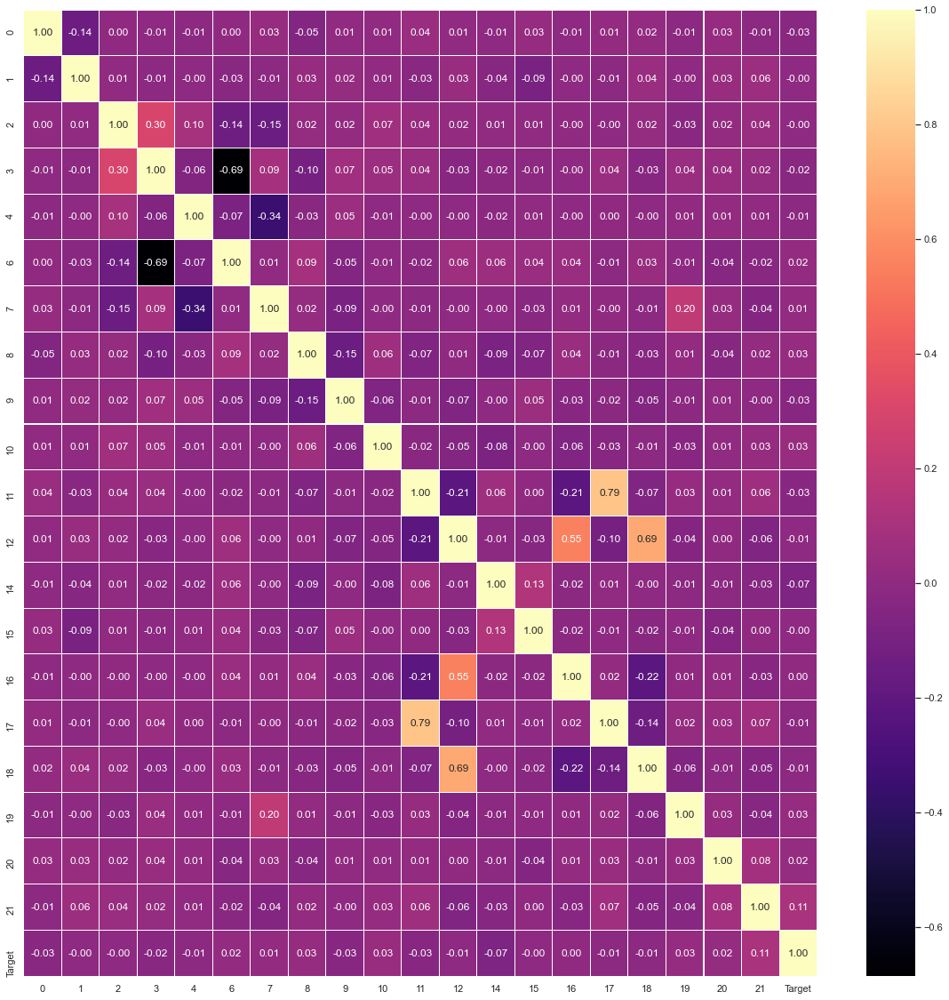

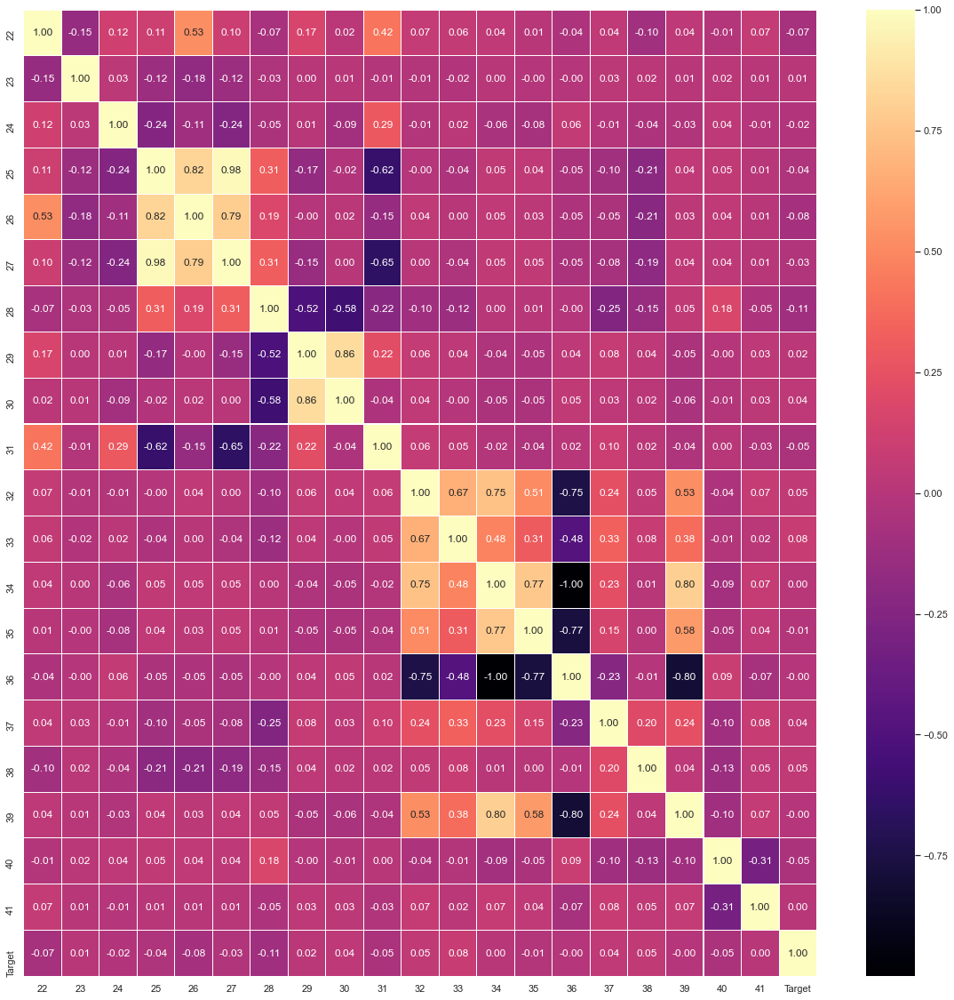

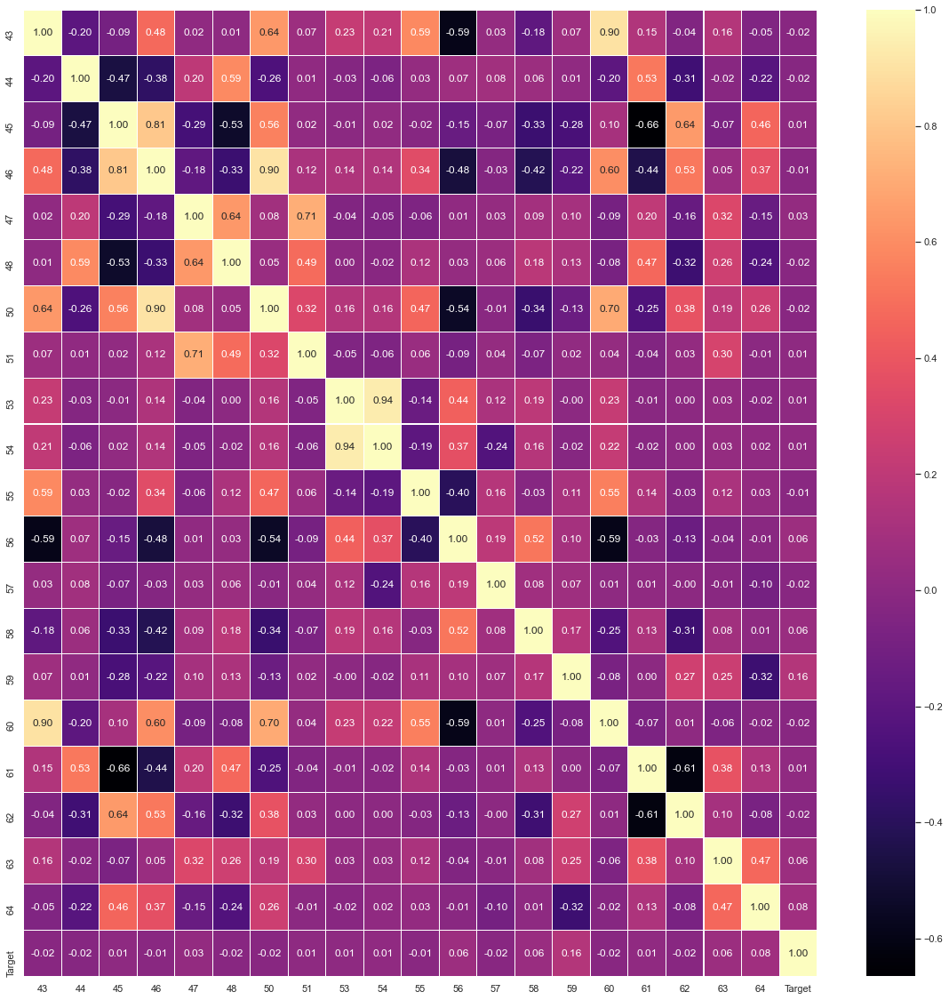

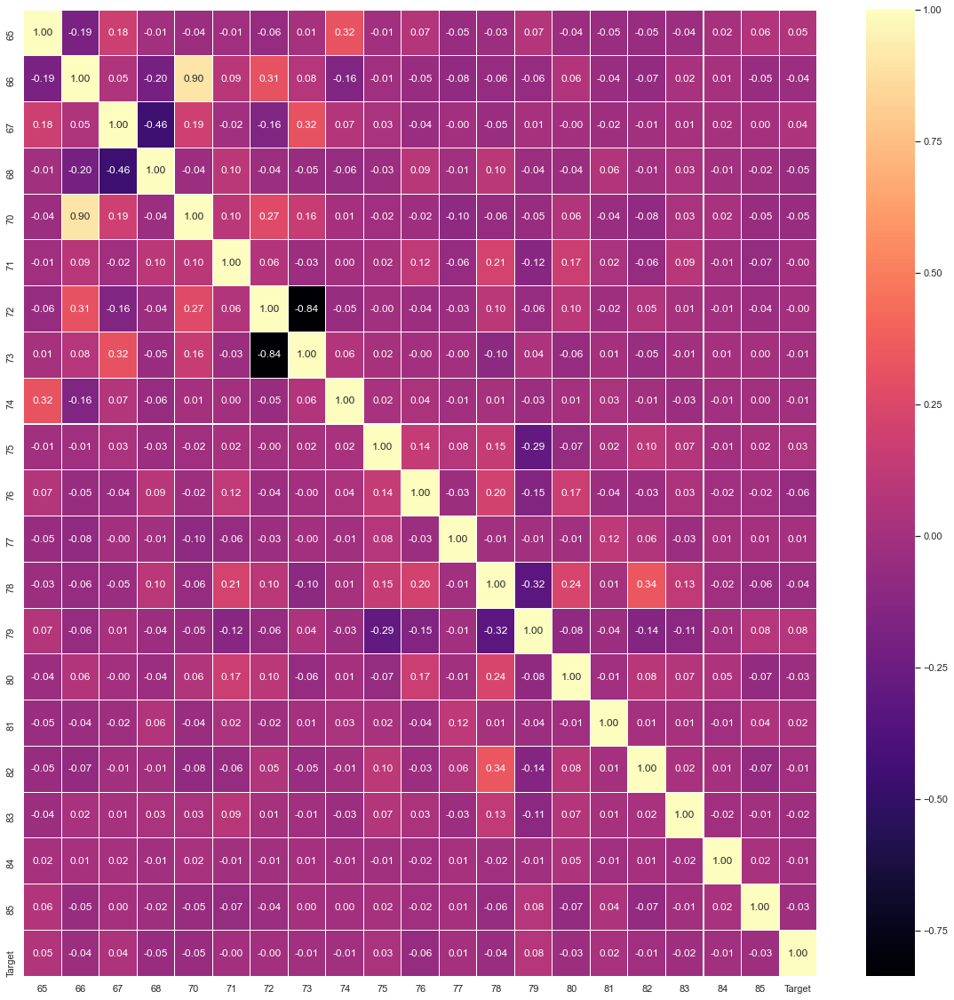

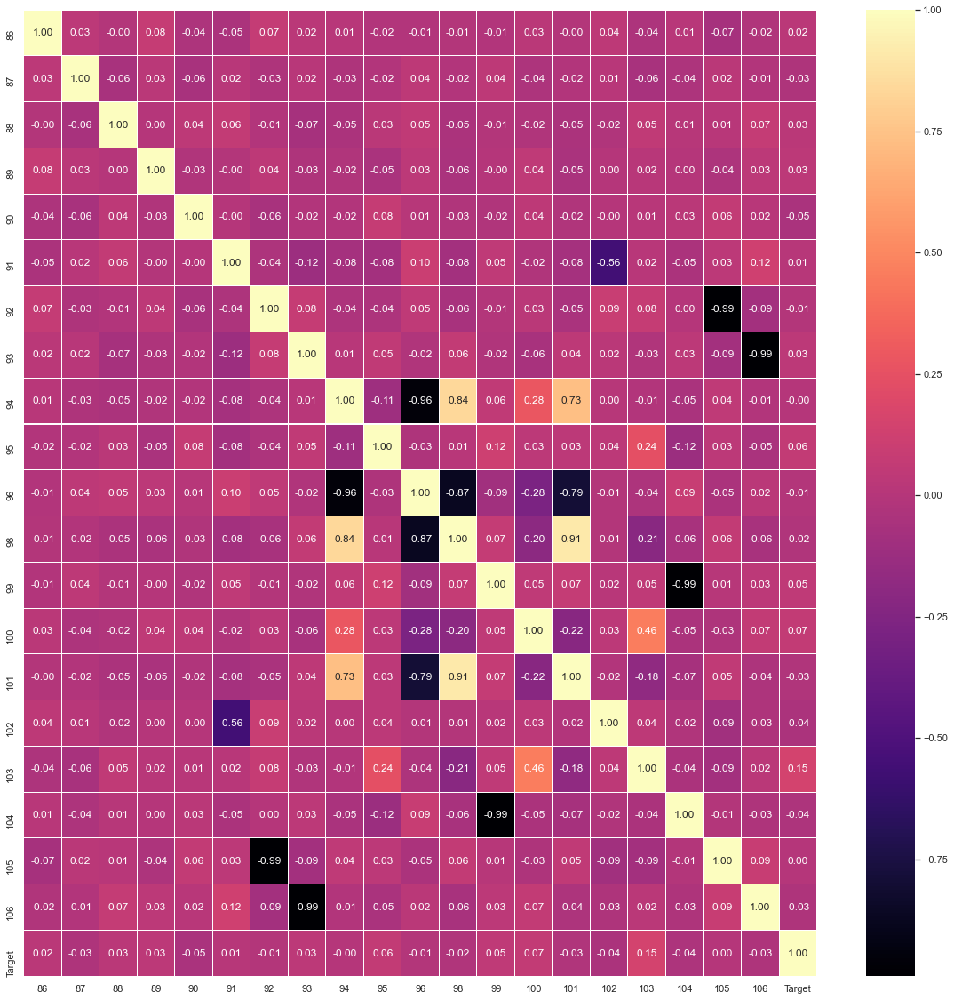

...

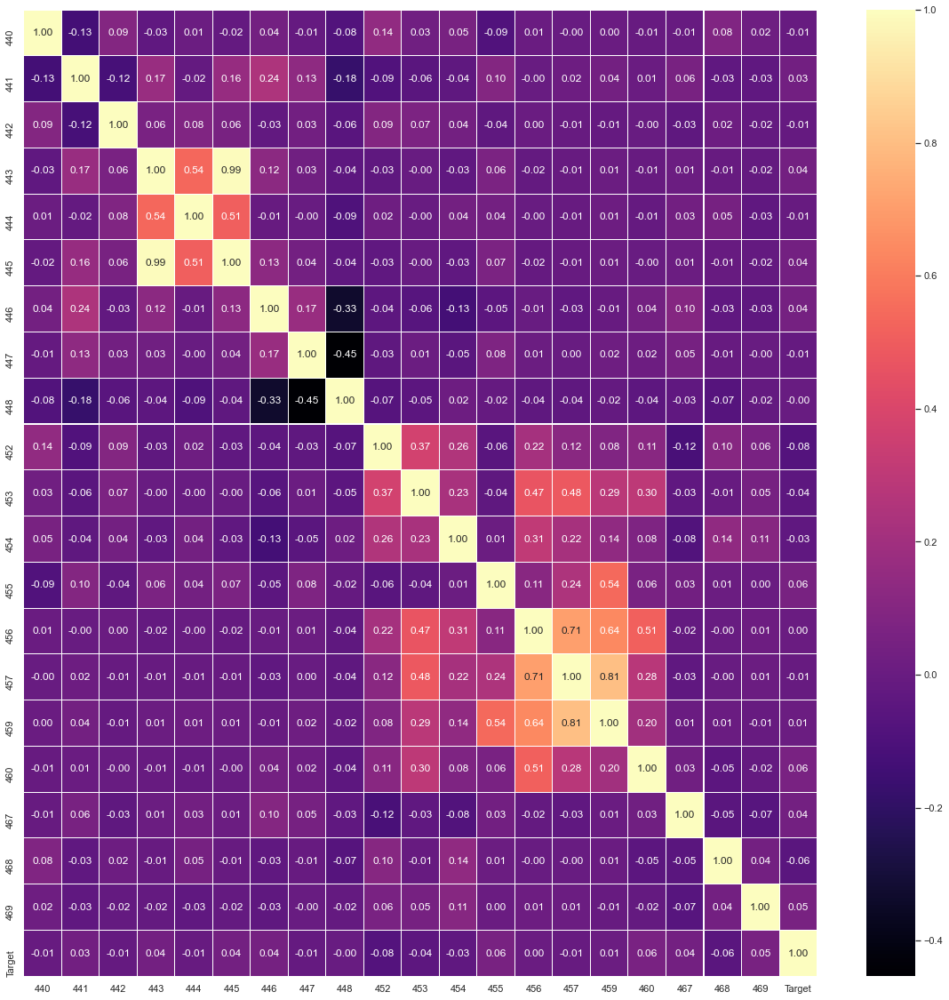

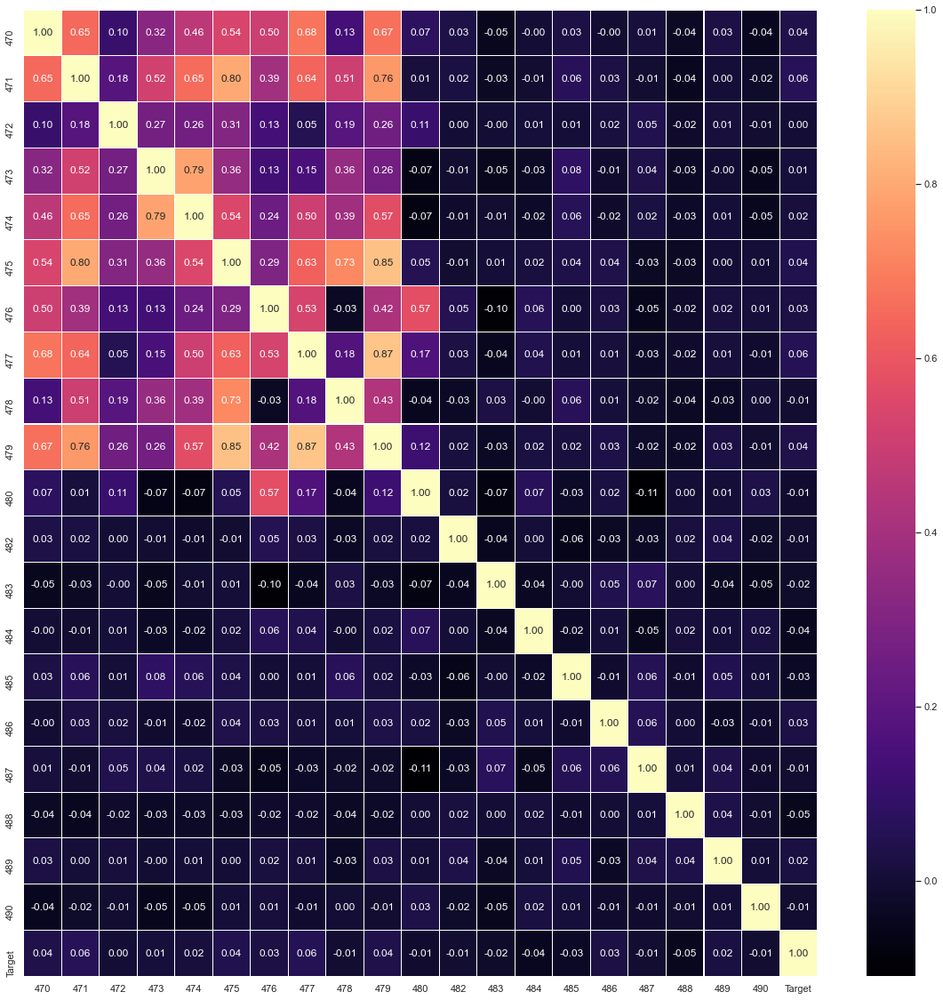

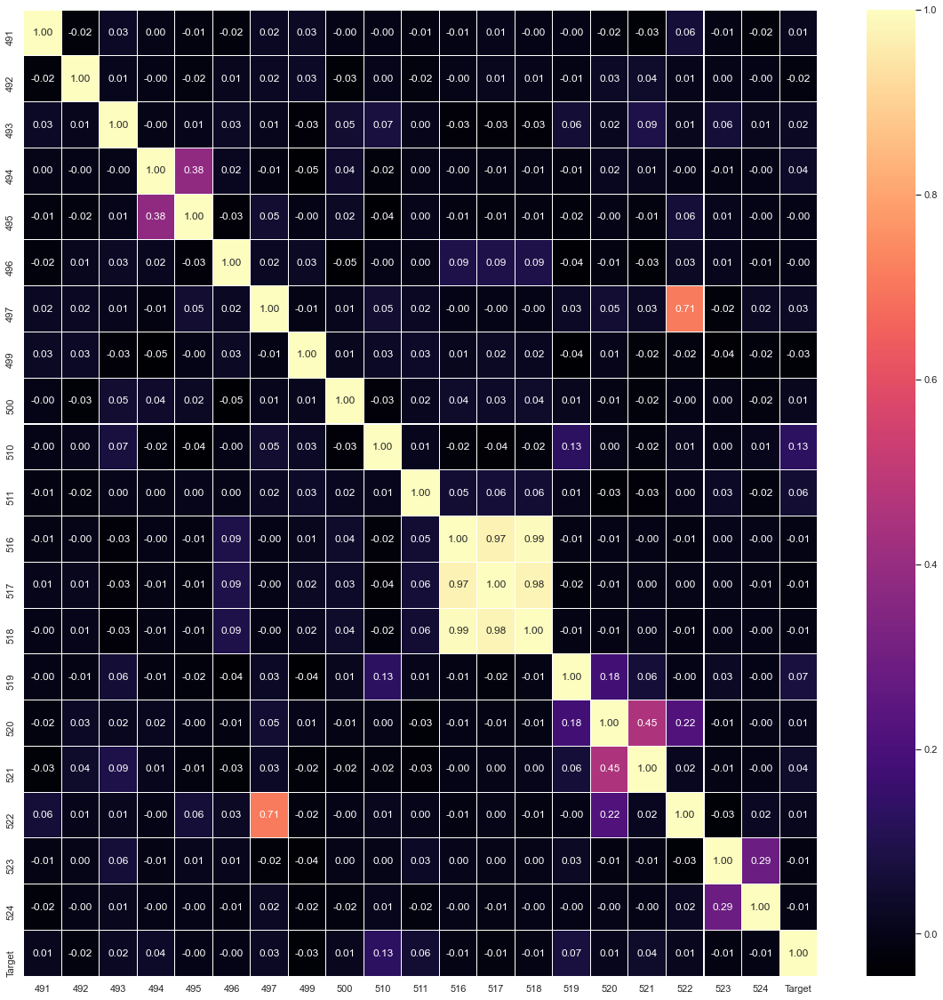

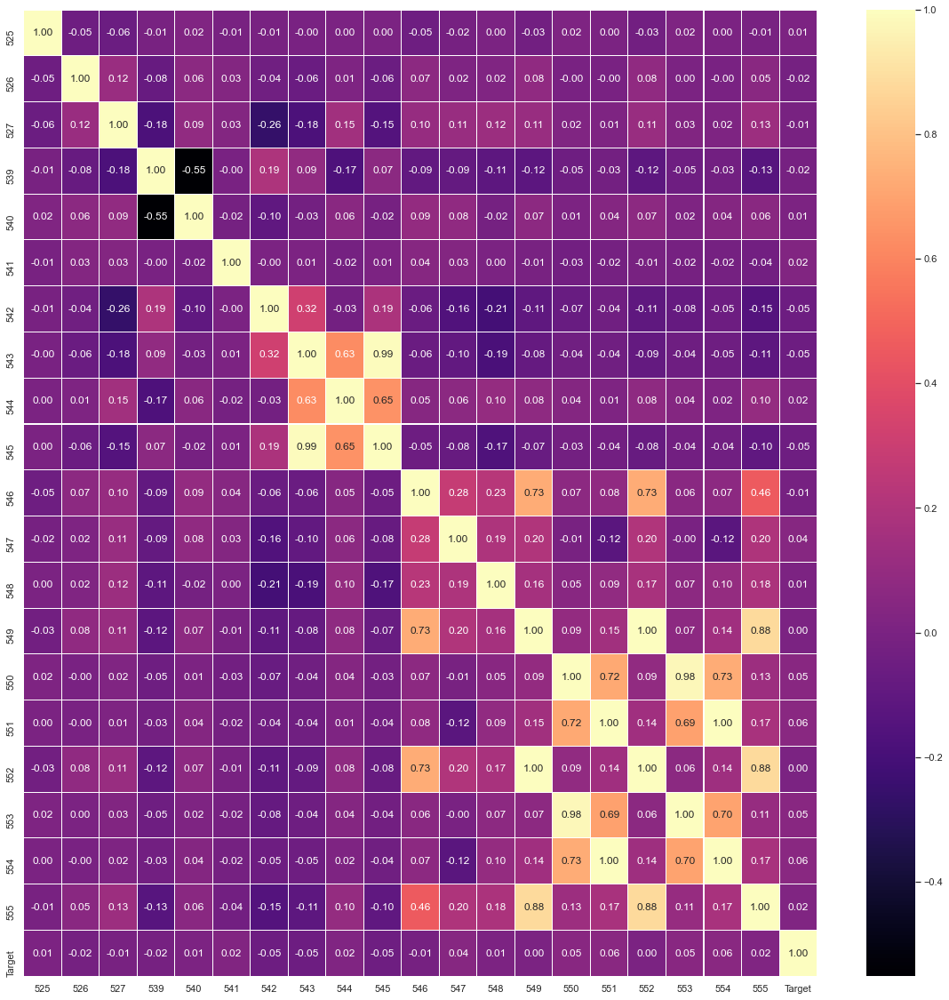

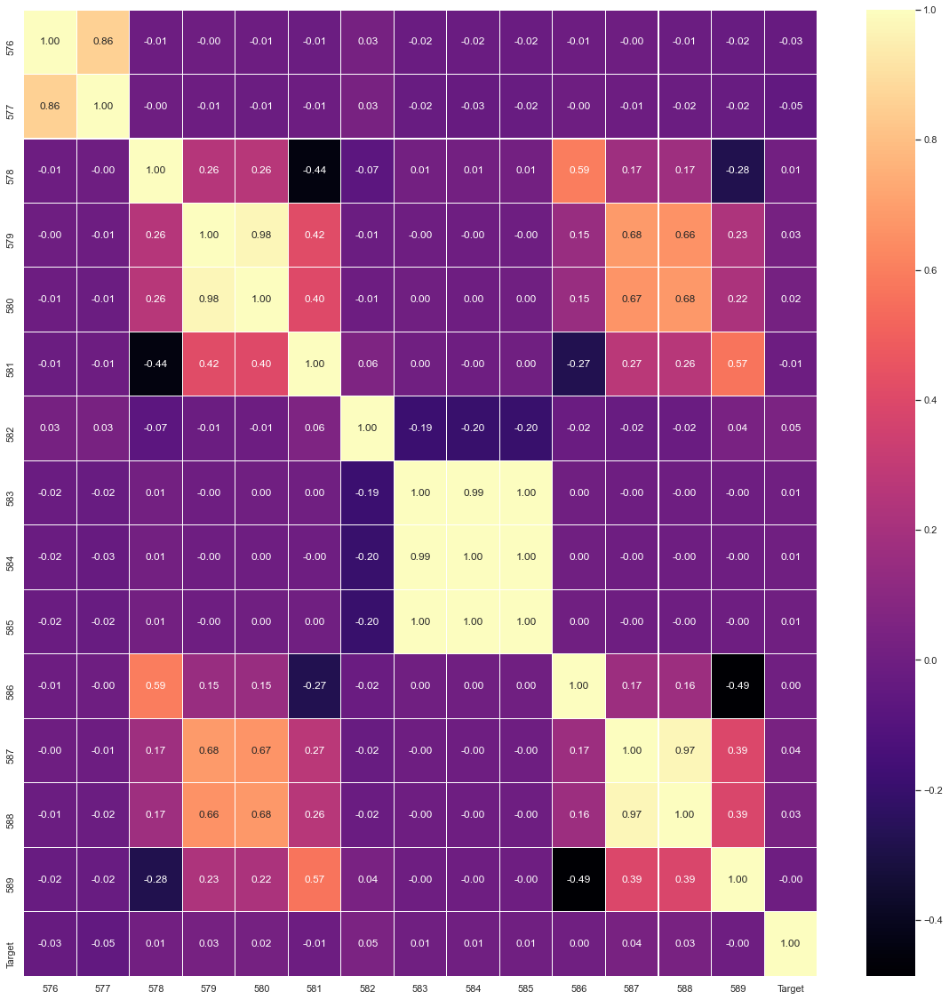

In [20]:
# Heat map for checking the correlation 

for i in range (0, 440, 20):
    plot_data = signal_data.iloc[:, i:i+20]
    plot_data['Target'] = signal_data.iloc[:,474]
    fig,ax = plt.subplots(figsize=(20, 20))   
    sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
    plt.show()
plot_data = signal_data.iloc[:, 460:474]
plot_data['Target'] = signal_data.iloc[:,474]
fig,ax = plt.subplots(figsize=(20, 20))   
sns.heatmap(plot_data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
plt.show()

#### Observation: 
<ol>
<li><span style="color:#228B22"> Selected pair of columns shows strong correlation
<li><span style="color:#228B22"> Few columns also exhibit negative correlation
<li><span style="color:#228B22"> The target column has a very weak correlation with most sensor data

### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 4. Data pre-processing

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Segregate predictors vs target attributes

In [15]:
from sklearn.model_selection import train_test_split
X = signal_data.iloc[:, :474]
y = signal_data.iloc[:, 474] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Check for target balancing and fix it if found imbalanced.

In [16]:
from imblearn.over_sampling import SMOTE

print("Before UpSampling, counts of label '-1': {}".format(sum(y_train==-1)))
print("Before UpSampling, counts of label '1': {} \n".format(sum(y_train==1)))

print('Before UpSampling, the shape of train_X: {}'.format(X_train.shape))
print('Before UpSampling, the shape of train_y: {} \n'.format(y_train.shape))

def smote(X, y):
    sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1) 
    X_res, y_res = sm.fit_resample(X, y.ravel())
    return X_res, y_res

X_train_upS, y_train_upS = smote(X_train, y_train)

print("After UpSampling, counts of label '-1': {}".format(sum(y_train_upS==-1)))
print("After UpSampling, counts of label '1': {} \n".format(sum(y_train_upS==1)))

print('After UpSampling, the shape of train_X: {}'.format(X_train_upS.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_upS.shape))

Before UpSampling, counts of label '-1': 1024
Before UpSampling, counts of label '1': 72 

Before UpSampling, the shape of train_X: (1096, 474)
Before UpSampling, the shape of train_y: (1096,) 

After UpSampling, counts of label '-1': 1024
After UpSampling, counts of label '1': 1024 

After UpSampling, the shape of train_X: (2048, 474)
After UpSampling, the shape of train_y: (2048,) 



##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Perform train-test split and standardise the data or vice versa if required

In [17]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer   

std_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
log_transformer = FunctionTransformer(np.log1p)

X_minmax = minmax_scaler.fit_transform(X, y)
X_std = std_scaler.fit_transform(X, y)
X_log = log_transformer.fit_transform(X_minmax, y)

X_train_minmax, X_test_minmax, y_train_minmax, y_test_minmax = train_test_split(X_minmax, y, test_size=0.3, random_state=1)
X_train_std, X_test_std, y_train_std, y_test_std = train_test_split(X_std, y, test_size=0.3, random_state=1)
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_log, y, test_size=0.3, random_state=1)

X_train_minmax_upS, y_train_upS = smote(X_train_minmax, y_train)
X_train_std_upS, y_train_upS = smote(X_train_std, y_train)
X_train_log_upS, y_train_upS = smote(X_train_log, y_train)

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Check if the train and test data have similar statistical characteristics when compared with original data

In [18]:
print('Before UpSampling, the mean of train_X: \n{}\n'.format(np.mean(X_train, axis=0)))
print('Before UpSampling, the mean of train_y: {} \n'.format(np.mean(y_train)))

print('After UpSampling, the mean of train_X: \n{}\n'.format(np.mean(X_train_upS, axis=0)))
print('After UpSampling, the mean of train_y: {} \n'.format(np.mean(y_train_upS)))



print('Before UpSampling, the standard deviation of train_X: \n{}\n'.format(np.std(X_train, axis=0)))
print('Before UpSampling, the standard deviation of train_y: {} \n'.format(np.std(y_train)))


print('After UpSampling, the standard deviation of train_X: \n{}\n'.format(np.std(X_train_upS, axis=0)))
print('After UpSampling, the standard deviation of train_y: {} \n'.format(np.std(y_train_upS)))

Before UpSampling, the mean of train_X: 
0      3015.084489
1      2496.140880
2      2200.604606
3      1394.835366
4         4.387727
          ...     
585       3.033263
586       0.021601
587       0.016583
588       0.005334
589     101.295199
Length: 474, dtype: float64

Before UpSampling, the mean of train_y: -0.8686131386861314 

After UpSampling, the mean of train_X: 
0      3012.996848
1      2496.835167
2      2199.670967
3      1364.914324
4         2.953278
          ...     
585       3.093566
586       0.021516
587       0.017551
588       0.005658
589     102.515732
Length: 474, dtype: float64

After UpSampling, the mean of train_y: 0.0 

Before UpSampling, the standard deviation of train_X: 
0       72.250072
1       79.142166
2       29.262116
3      435.644034
4       58.078056
          ...    
585      3.082521
586      0.012493
587      0.009253
588      0.003018
589     96.778306
Length: 474, dtype: float64

Before UpSampling, the standard deviation of train_y: 

#### Observation: 
<ol>
<li><span style="color:#228B22"> The mean of the target column has shifted and balanced as expected. 
<li><span style="color:#228B22"> The standard deviation of the target column is increased.
<li><span style="color:#228B22"> The statistical characteristics of individual feature columns are not much affected and remains almost same
<li><span style="color:#228B22"> The overall characteristics of the data is changed but within acceptable limits

### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 5. Model training, testing and tuning

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Model training

###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Pick up a supervised learning model.

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

model = LogisticRegression(solver="liblinear")

###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Train the model.

In [26]:
def predict(input_type, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    print ("The accuracy of prediction for the {} input is {}".format(input_type, model.score(X_test, y_test)))
    return y_predict

y_predict_raw = predict("raw", X_train, y_train, X_test, y_test)
y_pred_minmax = predict("mimax scaled", X_train_minmax, y_train, X_test_minmax, y_test)
y_pred_std = predict("standardized", X_train_std, y_train, X_test_std, y_test)
y_pred_log = predict("minmax scaled and log trasformed", X_train_log, y_train, X_test_log, y_test)
y_pred_upS = predict("upsampled", X_train_upS, y_train_upS, X_test, y_test)
y_pred_minmax_upS = predict("upsampled and mimax scaled", X_train_minmax_upS, y_train_upS, X_test_minmax, y_test)
y_pred_std_upS = predict("upsampled and standardized", X_train_std_upS, y_train_upS, X_test_std, y_test)
y_pred_log_upS = predict("upsampled, minmax scaled and log trasformed", X_train_log_upS, y_train_upS, X_test_log, y_test)

The accuracy of prediction for the raw input is 0.8980891719745223
The accuracy of prediction for the mimax scaled input is 0.9320594479830149
The accuracy of prediction for the standardized input is 0.8938428874734607
The accuracy of prediction for the minmax scaled and log trasformed input is 0.9320594479830149
The accuracy of prediction for the upsampled input is 0.821656050955414
The accuracy of prediction for the upsampled and mimax scaled input is 0.8301486199575372
The accuracy of prediction for the upsampled and standardized input is 0.8683651804670913
The accuracy of prediction for the upsampled, minmax scaled and log trasformed input is 0.8174097664543525


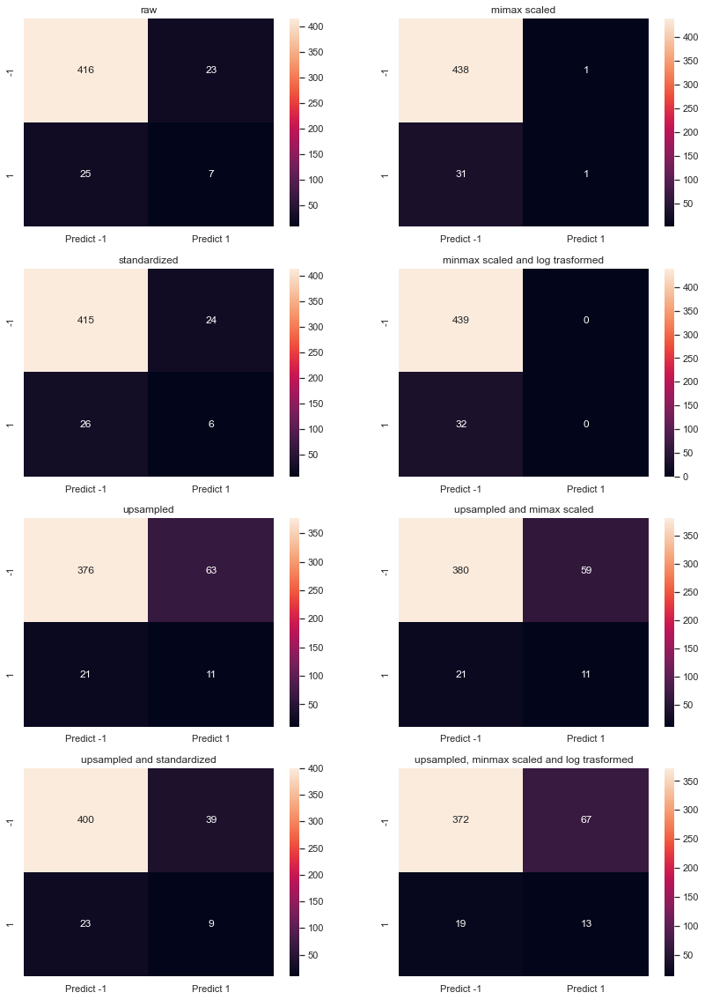

In [27]:
fig, axs = plt.subplots(4,2, figsize=(7*2,5*4))
axs=axs.flatten()
cases = { "raw":y_predict_raw, 
         "mimax scaled": y_pred_minmax,
         "standardized": y_pred_std,
         "minmax scaled and log trasformed": y_pred_log, 
         "upsampled":y_pred_upS, 
         "upsampled and mimax scaled":y_pred_minmax_upS, 
         "upsampled and standardized":y_pred_std_upS, 
         "upsampled, minmax scaled and log trasformed":y_pred_log_upS
        }

for i, (case, y_predict) in enumerate(cases.items()):
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[-1, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["-1","1"]],
                      columns = [i for i in ["Predict -1","Predict 1"]])
    axs[i].set_title(case)
    sns.heatmap(df_cm, annot=True, fmt='g', ax=axs[i]);

###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Use cross validation techniques.

In [28]:
from sklearn.model_selection import KFold
from sklearn.utils import resample # Bootstrap sampling
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

def kfold_accuracy(case, X, y):
    kfold = KFold(n_splits=20, random_state=1, shuffle=True)
    results = cross_val_score(model, X, y, cv=kfold)
    print("Kfold cross validation of " + case+ " input data gives mean accuracy of " "%.3f%%  with a standard deviation %.3f%%" % (results.mean()*100.0, results.std()*100.0))
    
kfold_accuracy("raw", X, y)
kfold_accuracy("minmax scaled", X_minmax, y)
kfold_accuracy("standardized", X_std, y)
kfold_accuracy("log transformed", X_log, y)

Kfold cross validation of raw input data gives mean accuracy of 91.320%  with a standard deviation 2.665%
Kfold cross validation of minmax scaled input data gives mean accuracy of 92.981%  with a standard deviation 2.041%
Kfold cross validation of standardized input data gives mean accuracy of 90.105%  with a standard deviation 2.892%
Kfold cross validation of log transformed input data gives mean accuracy of 93.300%  with a standard deviation 2.096%


In [29]:
def bootstrap_accuracy(case, data):
    n_iterations = 20
    n_size = int(len(signal_data) * 0.50)
    values=data.values

    stats = list()
    for i in range(n_iterations):
        train = resample(values, n_samples=n_size)
        test = np.array([x for x in values if x.tolist() not in train.tolist()])  
        model = LogisticRegression(solver="liblinear")
        model.fit(train[:,:-1], train[:,-1])
        predictions = model.predict(test[:,:-1])
        score = accuracy_score(test[:,-1], predictions)
        stats.append(score)
    stats = np.asarray(stats)
    print("Bootstrap cross validation of " + case+ " input data gives mean accuracy of " "%.3f%%  with a standard deviation %.3f%%" % (stats.mean()*100.0, stats.std()*100.0))
    return stats


signal_data_minmax = pd.DataFrame(data=np.column_stack((X_minmax, y.to_numpy())),
                                 index=signal_data.index,
                                 columns=signal_data.columns)

signal_data_std = pd.DataFrame(data=np.column_stack((X_std, y.to_numpy())),
                                 index=signal_data.index,
                                 columns=signal_data.columns)

signal_data_log = pd.DataFrame(data=np.column_stack((X_log, y.to_numpy())),
                                 index=signal_data.index,
                                 columns=signal_data.columns)

In [30]:
stats_raw = bootstrap_accuracy("raw", signal_data)
stats_minmax = bootstrap_accuracy("minmax scaled", signal_data_minmax)
stats_std = bootstrap_accuracy("standardized", signal_data_std)
stats_log = bootstrap_accuracy("log transformed", signal_data_log)

Bootstrap cross validation of raw input data gives mean accuracy of 86.654%  with a standard deviation 1.332%
Bootstrap cross validation of minmax scaled input data gives mean accuracy of 92.954%  with a standard deviation 0.522%
Bootstrap cross validation of standardized input data gives mean accuracy of 86.720%  with a standard deviation 0.945%
Bootstrap cross validation of log transformed input data gives mean accuracy of 93.273%  with a standard deviation 0.309%


For raw data and confidence interval alpha = 95.0 interval : [84.2%, 89.3%]
For mimax scaled data and confidence interval alpha = 95.0 interval : [92.2%, 93.8%]
For standardized data and confidence interval alpha = 95.0 interval : [84.7%, 88.1%]
For minmax scaled and log trasformed data and confidence interval alpha = 95.0 interval : [92.6%, 93.7%]


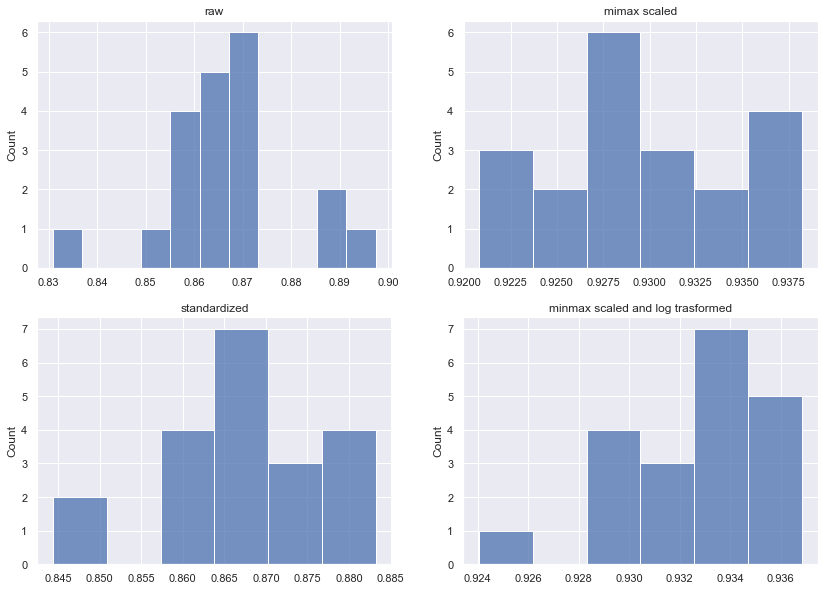

In [31]:
fig, axs = plt.subplots(2,2, figsize=(7*2,5*2))
axs=axs.flatten()
cases = { "raw":stats_raw, 
         "mimax scaled": stats_minmax,
         "standardized": stats_std,
         "minmax scaled and log trasformed": stats_log, 
        }

for i, (case, stats) in enumerate(cases.items()):
    axs[i].set_title(case)
    sns.histplot(stats, ax=axs[i]);
    
    alpha = 0.95 
    p = ((1.0-alpha)/2.0) * 100 
    lower = max(0.0, np.percentile(stats, p))
    p = (alpha+((1.0-alpha)/2.0)) * 100
    upper = min(1.0, np.percentile(stats, p))
    print('For '+case+' data and confidence interval '+'alpha = %.1f interval : [%.1f%%, %.1f%%]' % (alpha*100, lower*100, upper*100))


###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Apply hyper-parameter tuning techniques to get the best accuracy

In [20]:
from sklearn.model_selection import GridSearchCV
model = LogisticRegression()

param_grid = [{'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
             'penalty':['l2']}, {'solver':['liblinear', 'saga'], 
                               'penalty':['l1']}]

gs = GridSearchCV(model,param_grid,cv=10)

gs.fit(X_train, y_train)
gs.best_params_

{'penalty': 'l2', 'solver': 'sag'}

In [21]:
#Try with different classifier
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier()

param_grid = {"max_depth": [3, None],
              "max_features": [1, 3, 10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

gs = GridSearchCV(model, param_grid=param_grid)
gs.fit(X_train, y_train)
gs.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 3,
 'max_features': 1,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [22]:
#Try different search algorithm
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

model = RandomForestClassifier(n_estimators=50)

param_dist = {"max_depth": [3, None],
              "max_features": sp_randint(1, 11),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

randomCV = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10) 
randomCV.fit(X_train, y_train)
 
randomCV.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 2,
 'min_samples_leaf': 9,
 'min_samples_split': 7}

###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e">Use any other technique/method which can enhance the model performance

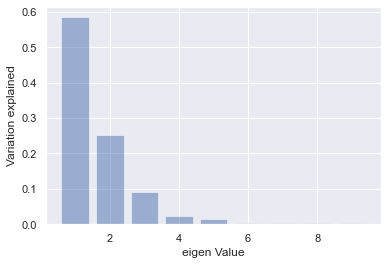

In [23]:
# Lets try principal component analysis for dimensionality reduction
from sklearn.decomposition import PCA
pca = PCA(n_components=9)
pca.fit(X_train)

plt.bar(list(range(1,10)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

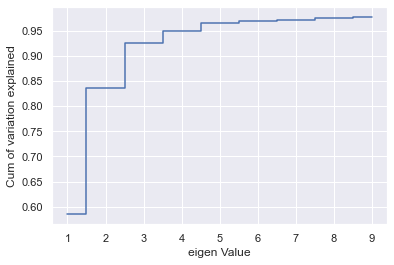

In [24]:
plt.step(list(range(1,10)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

#### Observation: 
<ol>
<li><span style="color:#228B22"> 

In [25]:
#Now lets experiment different dimensionality reduction, attribute removal, standardisation/normalisation, target balancing etc.
from imblearn.pipeline import Pipeline

pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 5, random_state=1)),
    ('scaler',StandardScaler()),
#     ('scaler', MinMaxScaler()),
#     ('scaler', FunctionTransformer(np.log1p)),
    ('pca', PCA(n_components=3)),
    ('clf', LogisticRegression(solver="newton-cg", random_state=1))
])

In [26]:
def score_matrix(pipe):
    pipe.fit(X_train,y_train)
    y_predict = pipe.predict(X_test)
    cm=metrics.confusion_matrix(y_test, y_predict, labels=[-1, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["-1","1"]],
                      columns = [i for i in ["Predict -1","Predict 1"]])
    sns.heatmap(df_cm, annot=True, fmt='g');
    print(" Test score: {:.2f}". format( pipe.score( X_test, y_test)))

 Test score: 0.90


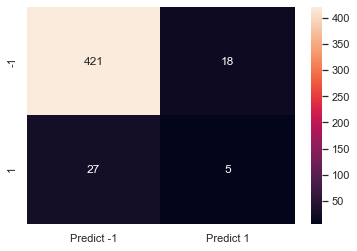

In [27]:
score_matrix(pipeline)

In [28]:
#Search for best parameters in pipeline

param_grid = {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6],'clf__solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']} 
grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5) 
grid.fit( X_train, y_train) 
y_pred = grid.predict(X_test)

print(" Best cross-validation accuracy: {:.2f}". format( grid.best_score_)) 
print(" Best parameters: ", grid.best_params_) 
print(" Test set accuracy: {:.2f}". format( grid.score( X_test, y_test)))

 Best cross-validation accuracy: 0.93
 Best parameters:  {'clf__solver': 'newton-cg', 'pca__n_components': 3, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 0.2}
 Test set accuracy: 0.93


###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Display and explain the classification report in detail.

In [29]:
from sklearn import metrics

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       439
           1       0.33      0.03      0.06        32

    accuracy                           0.93       471
   macro avg       0.63      0.51      0.51       471
weighted avg       0.89      0.93      0.90       471



###### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#da614e"> Apply the above steps for all possible models that you have learnt so far

In [30]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from mlxtend.classifier import StackingCVClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.neural_network import MLPClassifier

knn = KNeighborsClassifier(n_neighbors=5)
gnb = GaussianNB()
svc = SVC()
dtc = DecisionTreeClassifier()
mlc = MLPClassifier()

classifier_set = { 'K Neighbors Classifier': knn,
      'Gaussian Naive Bayes': gnb,
      'Support Vector Classifier': svc,
      'Decision Tree Classifier': dtc,
      'MLP Classifier': mlc
    }

for name, clf in classifier_set.items():
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])
    pipeline.fit(X_train,y_train) 
    y_pred = pipeline.predict(X_test)
    print ("Classification matrix for {} algorithm : ".format(name))
    
    report = pd.DataFrame(metrics.classification_report(y_test, 
                                        y_pred, digits=2,
                                        output_dict=True)).T
    report['support'] = report.support.apply(int)
    display(report)

Classification matrix for K Neighbors Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.935860,0.731207,0.820972,439
1,0.078125,0.312500,0.125000,32
accuracy,0.702760,0.702760,0.702760,0
macro avg,0.506993,0.521854,0.472986,471
weighted avg,0.877585,0.702760,0.773687,471


Classification matrix for Gaussian Naive Bayes algorithm : 


,precision,recall,f1-score,support
-1,0.947368,0.287016,0.440559,439
1,0.073964,0.781250,0.135135,32
accuracy,0.320594,0.320594,0.320594,0
macro avg,0.510666,0.534133,0.287847,471
weighted avg,0.888029,0.320594,0.419809,471


Classification matrix for Support Vector Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.937669,0.788155,0.856436,439
1,0.088235,0.281250,0.134328,32
accuracy,0.753715,0.753715,0.753715,0
macro avg,0.512952,0.534702,0.495382,471
weighted avg,0.879958,0.753715,0.807375,471


Classification matrix for Decision Tree Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.936556,0.706150,0.805195,439
1,0.078571,0.343750,0.127907,32
accuracy,0.681529,0.681529,0.681529,0
macro avg,0.507564,0.524950,0.466551,471
weighted avg,0.878264,0.681529,0.759179,471


Classification matrix for MLP Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.930939,0.767654,0.841448,439
1,0.064220,0.218750,0.099291,32
accuracy,0.730361,0.730361,0.730361,0
macro avg,0.497580,0.493202,0.470369,471
weighted avg,0.872054,0.730361,0.791026,471


In [31]:
lr = LogisticRegression()

bgc = BaggingClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()
rfc = RandomForestClassifier(n_estimators=50, random_state=1)
vtc = VotingClassifier(estimators=[
            ('lr', lr), ('knn', knn), ('gnb', gnb), ('dtc', dtc), ('bgc', bgc), ('abc', abc), ('gbc', gbc), ('rfc', rfc), ('mlc', mlc)],
            voting='soft',
            flatten_transform=True)
stc = StackingCVClassifier(classifiers=[knn, gnb, dtc, bgc, abc, gbc, rfc, mlc],
                           meta_classifier=lr,
                          random_state=1)

ensemble_set = { 
    'Bagging Classifier': bgc,
    'Adaaptive Boosting Classifier': abc,
    'Gradient Boosting Classifier': gbc,
    'Random Forest Classifier': rfc,
    'Voting Classifier' : vtc,
    'Stacking CV Classifier' : stc
}

for name, clf in ensemble_set.items():
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 5, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=4)),
    ('clf', clf)
    ])
    pipeline.fit(X_train,y_train) 
    y_pred = pipeline.predict(X_test)
    print ("Classification matrix for {} algorithm : ".format(name))
    
    report = pd.DataFrame(metrics.classification_report(y_test, 
                                        y_pred, digits=2,
                                        output_dict=True)).T
    report['support'] = report.support.apply(int)
    display(report)

Classification matrix for Bagging Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.946292,0.842825,0.891566,439
1,0.137500,0.343750,0.196429,32
accuracy,0.808917,0.808917,0.808917,0
macro avg,0.541896,0.593287,0.543997,471
weighted avg,0.891342,0.808917,0.844338,471


Classification matrix for Adaaptive Boosting Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.938719,0.767654,0.844612,439
1,0.089286,0.312500,0.138889,32
accuracy,0.736730,0.736730,0.736730,0
macro avg,0.514002,0.540077,0.491750,471
weighted avg,0.881008,0.736730,0.796664,471


Classification matrix for Gradient Boosting Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.939791,0.817768,0.874543,439
1,0.101124,0.281250,0.148760,32
accuracy,0.781316,0.781316,0.781316,0
macro avg,0.520457,0.549509,0.511652,471
weighted avg,0.882811,0.781316,0.825233,471


Classification matrix for Random Forest Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.948320,0.835991,0.888620,439
1,0.142857,0.375000,0.206897,32
accuracy,0.804671,0.804671,0.804671,0
macro avg,0.545589,0.605495,0.547758,471
weighted avg,0.893597,0.804671,0.842303,471


Classification matrix for Voting Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.945596,0.831435,0.884848,439
1,0.129412,0.343750,0.188034,32
accuracy,0.798301,0.798301,0.798301,0
macro avg,0.537504,0.587593,0.536441,471
weighted avg,0.890144,0.798301,0.837507,471


Classification matrix for Stacking CV Classifier algorithm : 


,precision,recall,f1-score,support
-1,0.938303,0.831435,0.881643,439
1,0.097561,0.250000,0.140351,32
accuracy,0.791932,0.791932,0.791932,0
macro avg,0.517932,0.540718,0.510997,471
weighted avg,0.881183,0.791932,0.831279,471


In [32]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_curve, precision_recall_curve, auc
import time

def fit_n_print(name, clf, param_grid, scorer, refit_score):
    
    start = time.time()
    
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])

        
#     grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5) 
    grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5, scoring=scorer, refit=refit_score)
    grid.fit( X_train, y_train) 
    y_pred = grid.predict(X_test)
    
    print ("The best parameters for {} and metic {} is {}".format(name, refit_score, grid.best_params_))
    
    accuracy =  accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    
    end = time.time()
    duration = end - start 
    
    
    return accuracy, precision, recall, f1, duration

parameters = { 
    'K Neighbors Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__n_neighbors':[3, 4, 5, 6], 'clf__weights':['uniform', 'distance'], 'clf__metric':['euclidean', 'manhattan']},
    'Gaussian Naive Bayes':  {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__priors': [None], 'clf__var_smoothing': [0.00000001, 0.000000001, 0.00000001]},
    'Support Vector Classifier':  {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__C': [0.1, 1, 10, 100, 1000], 'clf__gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'clf__kernel': ['rbf']},
      'Decision Tree Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__max_leaf_nodes': list(range(2, 10,)), 'clf__min_samples_split': [2, 3, 4]},
      'Bagging Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], "clf__max_samples": [0.5, 1.0], "clf__max_features": [2, 4 , 6, 10, 20, 40],  "clf__bootstrap": [True, False], "clf__bootstrap_features": [True, False]},
      'Adaaptive Boosting Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 
#                                         "clf__base_estimator__criterion" : ["gini", "entropy"], "clf__base_estimator__splitter" :   ["best", "random"], 
                                        "clf__n_estimators": [2, 4, 6, 10, 20]},
#       'Gradient Boosting Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], "clf__loss":["deviance"], "clf__learning_rate": [0.01, 0.05, 0.1, 0.2], "clf__min_samples_split": np.linspace(0.1, 0.5, 4),  "clf__min_samples_leaf": np.linspace(0.1, 0.5, 4), "clf__max_depth":[3,5,8], "clf__max_features":["log2","sqrt"], "clf__criterion": ["friedman_mse",  "mae"],    "clf__subsample":[0.5, 0.8, 0.9, 1.0], "clf__n_estimators":[10]},
    'Gradient Boosting Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6], "clf__loss":["deviance"], "clf__learning_rate": [0.01, 0.2], "clf__min_samples_split": np.linspace(0.1, 0.5, 3),  "clf__min_samples_leaf": np.linspace(0.1, 0.5, 3), "clf__max_depth":[3,5,8], "clf__max_features":["log2","sqrt"], "clf__criterion": ["friedman_mse",  "mae"],    "clf__subsample":[0.5, 1.0], "clf__n_estimators":[10]},
#     'Random Forest Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__n_estimators': [200, 500], 'clf__max_features': ['auto', 'sqrt', 'log2'],  'clf__max_depth' : [4,5,6,7,8],  'clf__criterion' :['gini', 'entropy']},
    'Random Forest Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6], 'clf__n_estimators': [200, 500], 'clf__max_features': ['auto', 'sqrt', 'log2'],  'clf__max_depth' : [4,8],  'clf__criterion' :['gini', 'entropy']},
#       'MLP Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6], 'clf__learning_rate': ["constant", "invscaling", "adaptive"], 'clf__hidden_layer_sizes': [(100,1), (100,2), (100,3)], 'clf__alpha': [10.0 ** -np.arange(1, 7)], 'clf__activation': ["logistic", "relu", "Tanh"]},
    'MLP Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6],
#                        'clf__learning_rate': ["constant", "invscaling", "adaptive"], 'clf__hidden_layer_sizes': [(100,1), (100,2), (100,3)], 
                       'clf__hidden_layer_sizes': [(10,30,10),(20,)], 'clf__solver': ['sgd', 'adam'], 'clf__alpha': [0.0001, 0.05], 'clf__activation': ["logistic", "relu", "Tanh"]},
#       'Voting Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6]},
    'Voting Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6]},
#       'Stacking CV Classifier': {'upsamp__sampling_strategy':[0.2,0.4,0.6,0.8,1], 'upsamp__k_neighbors':[2,3,4,5], 'pca__n_components':[3,4,5,6]},           
    'Stacking CV Classifier': {'upsamp__sampling_strategy':[0.2,1], 'upsamp__k_neighbors':[2,5], 'pca__n_components':[3,6]},           
    }

scorer = {
    'default' : None,
    'accuracy': metrics.make_scorer(accuracy_score),
    'precision' : metrics.make_scorer(precision_score),
    'recall' : metrics.make_scorer(recall_score),
    'f1' : metrics.make_scorer(f1_score)
           }

result ={}

In [45]:
result_scores = {}
name = 'K Neighbors Classifier'
clf = knn
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for K Neighbors Classifier and metic default is {'clf__metric': 'manhattan', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 6, 'upsamp__k_neighbors': 3, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic accuracy is {'clf__metric': 'euclidean', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 6, 'upsamp__k_neighbors': 3, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic precision is {'clf__metric': 'manhattan', 'clf__n_neighbors': 6, 'clf__weights': 'uniform', 'pca__n_components': 5, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.2}
The best parameters for K Neighbors Classifier and metic recall is {'clf__metric': 'euclidean', 'clf__n_neighbors': 4, 'clf__weights': 'distance', 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 1}
The best parameters for K Neighbors Classifier and metic f1 is {'clf__metri

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.915074,0.250000,0.12500,0.166667,636.401486
accuracy,0.912951,0.200000,0.09375,0.127660,644.654571
precision,0.912951,0.304348,0.21875,0.254545,642.044752
recall,0.694268,0.094203,0.40625,0.152941,639.529229
f1,0.878981,0.195122,0.25000,0.219178,633.437343


In [46]:
result_scores = {}
name = 'Gaussian Naive Bayes'
clf = gnb
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Gaussian Naive Bayes and metic default is {'clf__priors': None, 'clf__var_smoothing': 1e-08, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Gaussian Naive Bayes and metic accuracy is {'clf__priors': None, 'clf__var_smoothing': 1e-08, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Gaussian Naive Bayes and metic precision is {'clf__priors': None, 'clf__var_smoothing': 1e-08, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Gaussian Naive Bayes and metic recall is {'clf__priors': None, 'clf__var_smoothing': 1e-08, 'pca__n_components': 6, 'upsamp__k_neighbors': 3, 'upsamp__sampling_strategy': 1}
The best parameters for Gaussian Naive Bayes and metic f1 is {'clf__priors': None, 'clf__var_smoothing': 1e-08, 'pca__n_components': 3, 'upsamp__k_neighbors': 3, 'upsamp__sampling_strategy': 0.4}


,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.921444,0.222222,0.06250,0.097561,109.452864
accuracy,0.921444,0.222222,0.06250,0.097561,109.529912
precision,0.921444,0.222222,0.06250,0.097561,109.670356
recall,0.099788,0.068282,0.96875,0.127572,110.005741
f1,0.910828,0.142857,0.06250,0.086957,109.937930


In [47]:
result_scores = {}
name = 'Support Vector Classifier'
clf = svc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Support Vector Classifier and metic default is {'clf__C': 1, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'pca__n_components': 5, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Support Vector Classifier and metic accuracy is {'clf__C': 1, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'pca__n_components': 5, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Support Vector Classifier and metic precision is {'clf__C': 100, 'clf__gamma': 0.01, 'clf__kernel': 'rbf', 'pca__n_components': 5, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.2}
The best parameters for Support Vector Classifier and metic recall is {'clf__C': 100, 'clf__gamma': 0.001, 'clf__kernel': 'rbf', 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 1}
The best parameters for Support Vector Classifier and metic f1 is {'clf__C': 100, 'clf__gamma': 0.0001, 'clf__kernel': 'rbf', 'pca__n_components': 5, 'up

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.929936,0.000000,0.00000,0.000000,2259.217015
accuracy,0.929936,0.000000,0.00000,0.000000,2338.286717
precision,0.932059,0.500000,0.03125,0.058824,2259.482489
recall,0.526539,0.097046,0.71875,0.171004,2267.863333
f1,0.885350,0.107143,0.09375,0.100000,2287.266174


In [48]:
result_scores = {}
name = 'Decision Tree Classifier'
clf = dtc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Decision Tree Classifier and metic default is {'clf__max_leaf_nodes': 2, 'clf__min_samples_split': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Decision Tree Classifier and metic accuracy is {'clf__max_leaf_nodes': 2, 'clf__min_samples_split': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Decision Tree Classifier and metic precision is {'clf__max_leaf_nodes': 8, 'clf__min_samples_split': 3, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Decision Tree Classifier and metic recall is {'clf__max_leaf_nodes': 3, 'clf__min_samples_split': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 1}
The best parameters for Decision Tree Classifier and metic f1 is {'clf__max_leaf_nodes': 9, 'clf__min_samples_split': 3, 'pca__n_components': 5, 'upsamp__k_neig

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,905.036062
accuracy,0.932059,0.000000,0.00000,0.000000,907.620934
precision,0.887473,0.137931,0.12500,0.131148,897.682848
recall,0.426752,0.089655,0.81250,0.161491,912.127307
f1,0.785563,0.151515,0.46875,0.229008,908.016589


In [49]:
result_scores = {}
name = 'Bagging Classifier'
clf = bgc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Bagging Classifier and metic default is {'clf__bootstrap': False, 'clf__bootstrap_features': True, 'clf__max_features': 2, 'clf__max_samples': 0.5, 'pca__n_components': 6, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Bagging Classifier and metic accuracy is {'clf__bootstrap': False, 'clf__bootstrap_features': True, 'clf__max_features': 2, 'clf__max_samples': 0.5, 'pca__n_components': 6, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Bagging Classifier and metic precision is {'clf__bootstrap': True, 'clf__bootstrap_features': True, 'clf__max_features': 4, 'clf__max_samples': 0.5, 'pca__n_components': 5, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Bagging Classifier and metic recall is {'clf__bootstrap': False, 'clf__bootstrap_features': True, 'clf__max_features': 2, 'clf__max_samples': 1.0, 'pca__n_components': 3, 'upsamp__k_neighbors': 5, 'upsamp__

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.925690,0.200000,0.03125,0.054054,1852.940785
accuracy,0.927813,0.000000,0.00000,0.000000,1872.190507
precision,0.919321,0.125000,0.03125,0.050000,1878.350710
recall,0.681529,0.090278,0.40625,0.147727,1848.054585
f1,0.766454,0.066667,0.18750,0.098361,1836.675993


In [50]:
result_scores = {}
name = 'Adaaptive Boosting Classifier'
clf = abc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Adaaptive Boosting Classifier and metic default is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Adaaptive Boosting Classifier and metic accuracy is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Adaaptive Boosting Classifier and metic precision is {'clf__n_estimators': 4, 'pca__n_components': 3, 'upsamp__k_neighbors': 4, 'upsamp__sampling_strategy': 0.4}
The best parameters for Adaaptive Boosting Classifier and metic recall is {'clf__n_estimators': 2, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 1}
The best parameters for Adaaptive Boosting Classifier and metic f1 is {'clf__n_estimators': 2, 'pca__n_components': 6, 'upsamp__k_neighbors': 3, 'upsamp__sampling_strategy': 1}


,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,213.104195
accuracy,0.932059,0.000000,0.00000,0.000000,213.544571
precision,0.929936,0.333333,0.03125,0.057143,213.952067
recall,0.460722,0.091912,0.78125,0.164474,221.758428
f1,0.473461,0.093985,0.78125,0.167785,221.970244


In [51]:
result_scores = {}
name = 'Gradient Boosting Classifier'
clf = gbc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Gradient Boosting Classifier and metic default is {'clf__criterion': 'friedman_mse', 'clf__learning_rate': 0.01, 'clf__loss': 'deviance', 'clf__max_depth': 3, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 0.1, 'clf__min_samples_split': 0.1, 'clf__n_estimators': 10, 'clf__subsample': 0.5, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Gradient Boosting Classifier and metic accuracy is {'clf__criterion': 'friedman_mse', 'clf__learning_rate': 0.01, 'clf__loss': 'deviance', 'clf__max_depth': 3, 'clf__max_features': 'log2', 'clf__min_samples_leaf': 0.1, 'clf__min_samples_split': 0.1, 'clf__n_estimators': 10, 'clf__subsample': 0.5, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Gradient Boosting Classifier and metic precision is {'clf__criterion': 'mae', 'clf__learning_rate': 0.01, 'clf__loss': 'deviance', 'clf__max_depth': 3, 'clf__max_fea

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,2029.769988
accuracy,0.932059,0.000000,0.00000,0.000000,2020.405248
precision,0.619958,0.102703,0.59375,0.175115,1999.875583
recall,0.932059,0.000000,0.00000,0.000000,1962.661599
f1,0.675159,0.093960,0.43750,0.154696,1945.313916


In [52]:
result_scores = {}
name = 'Random Forest Classifier'
clf = rfc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Random Forest Classifier and metic default is {'clf__criterion': 'gini', 'clf__max_depth': 4, 'clf__max_features': 'auto', 'clf__n_estimators': 200, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Random Forest Classifier and metic accuracy is {'clf__criterion': 'gini', 'clf__max_depth': 4, 'clf__max_features': 'auto', 'clf__n_estimators': 200, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Random Forest Classifier and metic precision is {'clf__criterion': 'gini', 'clf__max_depth': 8, 'clf__max_features': 'auto', 'clf__n_estimators': 200, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Random Forest Classifier and metic recall is {'clf__criterion': 'entropy', 'clf__max_depth': 4, 'clf__max_features': 'sqrt', 'clf__n_estimators': 500, 'pca__n_components': 3, 'upsamp__k_neighbors': 2, '

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,712.252066
accuracy,0.932059,0.000000,0.00000,0.000000,711.228926
precision,0.929936,0.000000,0.00000,0.000000,711.716566
recall,0.545648,0.104348,0.75000,0.183206,711.278790
f1,0.749469,0.101852,0.34375,0.157143,711.393216


In [53]:
result_scores = {}
name = 'MLP Classifier'
clf = mlc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for MLP Classifier and metic default is {'clf__activation': 'logistic', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': (10, 30, 10), 'clf__solver': 'sgd', 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for MLP Classifier and metic accuracy is {'clf__activation': 'logistic', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': (10, 30, 10), 'clf__solver': 'sgd', 'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for MLP Classifier and metic precision is {'clf__activation': 'relu', 'clf__alpha': 0.05, 'clf__hidden_layer_sizes': (10, 30, 10), 'clf__solver': 'adam', 'pca__n_components': 3, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 0.2}
The best parameters for MLP Classifier and metic recall is {'clf__activation': 'logistic', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': (10, 30, 10), 'clf__solver': 'sgd', 'pca__n_components': 6, 'upsamp__k_neighbor

,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.932059,0.000000,0.00000,0.000000,412.437884
accuracy,0.932059,0.000000,0.00000,0.000000,415.256785
precision,0.921444,0.142857,0.03125,0.051282,411.448923
recall,0.067941,0.067941,1.00000,0.127237,415.029926
f1,0.683652,0.096552,0.43750,0.158192,421.444529


In [54]:
result_scores = {}
name = 'Voting Classifier'
clf = vtc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Voting Classifier and metic default is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Voting Classifier and metic accuracy is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Voting Classifier and metic precision is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Voting Classifier and metic recall is {'pca__n_components': 3, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 1}
The best parameters for Voting Classifier and metic f1 is {'pca__n_components': 6, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 1}


,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.915074,0.000000,0.0000,0.000000,55.411232
accuracy,0.919321,0.000000,0.0000,0.000000,54.281219
precision,0.915074,0.000000,0.0000,0.000000,53.882148
recall,0.685775,0.085714,0.3750,0.139535,54.555346
f1,0.806794,0.084507,0.1875,0.116505,54.436295


In [55]:
result_scores = {}
name = 'Stacking CV Classifier'
clf = stc
param = parameters[name]
for refit_score in scorer:
    result_scores[refit_score] = fit_n_print(name, clf, param, scorer, refit_score)
result[name] = result_scores    

result_table = pd.DataFrame(np.array(list(result_scores.values()))[:,:], 
                       columns= ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Time Elapsed'],
                      index= result_scores.keys())
result_table.index.name = 'Refit Score'
result_table 

The best parameters for Stacking CV Classifier and metic default is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Stacking CV Classifier and metic accuracy is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Stacking CV Classifier and metic precision is {'pca__n_components': 3, 'upsamp__k_neighbors': 2, 'upsamp__sampling_strategy': 0.2}
The best parameters for Stacking CV Classifier and metic recall is {'pca__n_components': 6, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 1}
The best parameters for Stacking CV Classifier and metic f1 is {'pca__n_components': 6, 'upsamp__k_neighbors': 5, 'upsamp__sampling_strategy': 1}


,Accuracy,Precision,Recall,F1 Score,Time Elapsed
Refit Score,,,,,
default,0.902335,0.000000,0.00000,0.000000,113.522170
accuracy,0.923567,0.000000,0.00000,0.000000,114.084308
precision,0.919321,0.125000,0.03125,0.050000,114.329680
recall,0.819533,0.136986,0.31250,0.190476,115.598201
f1,0.815287,0.133333,0.31250,0.186916,115.650262


##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Display and compare all the models designed with their train and test accuracies.

In [42]:
#We select the best models based on f1 score

def fit_n_print(name, clf, param_grid, scorer, refit_score):
        
    pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', clf)
    ])

    grid = GridSearchCV( pipeline , param_grid = param_grid, cv = 5, scoring=scorer, refit=refit_score)
    grid.fit( X_train, y_train) 
    
    y_pred_train = grid.predict(X_train)
    y_pred_test = grid.predict(X_test)
    
    accuracy_train =  accuracy_score(y_train, y_pred_train)
    accuracy_test =  accuracy_score(y_test, y_pred_test)
    
    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)
    
    return accuracy_train, accuracy_test, f1_train, f1_test


names = ['K Neighbors Classifier', 'Gaussian Naive Bayes', 'Support Vector Classifier', 'Decision Tree Classifier', 'Bagging Classifier',  'Adaaptive Boosting Classifier',  'Gradient Boosting Classifier', 'Random Forest Classifier', 'MLP Classifier', 'Voting Classifier', 'Stacking CV Classifier']
clfs = [knn, gnb, svc, dtc, bgc, abc, gbc, rfc, mlc, vtc, stc]

best_params_f1 = {
    'K Neighbors Classifier': {'clf__metric': ['euclidean'], 'clf__n_neighbors': [4], 'clf__weights': ['distance'], 'pca__n_components': [6], 'upsamp__k_neighbors': [4], 'upsamp__sampling_strategy': [0.2]}, 
    'Gaussian Naive Bayes': {'clf__priors': [None], 'clf__var_smoothing': [1e-08], 'pca__n_components': [3], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [0.4]},
    'Support Vector Classifier': {'clf__C': [100], 'clf__gamma': [0.0001], 'clf__kernel': ['rbf'], 'pca__n_components': [5], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [0.8]}, 
    'Decision Tree Classifier': {'clf__max_leaf_nodes': [9], 'clf__min_samples_split': [3], 'pca__n_components': [5], 'upsamp__k_neighbors': [4], 'upsamp__sampling_strategy': [0.4]}, 
    'Bagging Classifier': {'clf__bootstrap': [False], 'clf__bootstrap_features': [False], 'clf__max_features': [6], 'clf__max_samples': [1.0], 'pca__n_components': [6], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [1]}, 
    'Adaaptive Boosting Classifier': {'clf__n_estimators': [2], 'pca__n_components': [6], 'upsamp__k_neighbors': [3], 'upsamp__sampling_strategy': [1]},  
    'Gradient Boosting Classifier' : {'clf__criterion': ['mae'], 'clf__learning_rate': [0.2], 'clf__loss': ['deviance'], 'clf__max_depth': [5], 'clf__max_features': ['sqrt'], 'clf__min_samples_leaf': [0.1], 'clf__min_samples_split': [0.1], 'clf__n_estimators': [10], 'clf__subsample': [1.0], 'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}, 
    'Random Forest Classifier': {'clf__criterion': ['gini'], 'clf__max_depth': [4], 'clf__max_features': ['sqrt'], 'clf__n_estimators': [500], 'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}, 
    'MLP Classifier': {'clf__activation': ['logistic'], 'clf__alpha': [0.0001], 'clf__hidden_layer_sizes': [(20,)], 'clf__solver': ['sgd'], 'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}, 
    'Voting Classifier': {'pca__n_components': [6], 'upsamp__k_neighbors': [2], 'upsamp__sampling_strategy': [1]}, 
    'Stacking CV Classifier': {'pca__n_components': [6], 'upsamp__k_neighbors': [5], 'upsamp__sampling_strategy': [1]}
}

for index, name in enumerate(names):
    clf=clfs[index]
    param = best_params_f1[name]
    result_matrix = fit_n_print(name, clf, param, scorer, refit_score)
    result[name] = result_matrix

In [47]:
pd.DataFrame.from_dict(result, orient='index', columns=['train accuracy', 'test accuracy', 'train f1 score', 'test f1 score'])

,train accuracy,test accuracy,train f1 score,test f1 score
K Neighbors Classifier,1.000000,0.870488,1.000000,0.186667
Gaussian Naive Bayes,0.916971,0.910828,0.133333,0.086957
Support Vector Classifier,0.886861,0.889597,0.243902,0.103448
Decision Tree Classifier,0.820255,0.785563,0.278388,0.229008
Bagging Classifier,0.984489,0.768577,0.888889,0.099174
Adaaptive Boosting Classifier,0.458029,0.473461,0.151429,0.167785
Gradient Boosting Classifier,0.686131,0.660297,0.221719,0.175258
Random Forest Classifier,0.783759,0.738854,0.288288,0.163265
MLP Classifier,0.692518,0.692144,0.180049,0.161850
Voting Classifier,0.976277,0.813163,0.845238,0.137255


##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Select the final best trained model along with your detailed comments for selecting this model. 

#### Observation: 
<ol>
<li><span style="color:#228B22"> We select the stacking CV classifier as it gives excellent accuracy as well as f1 score. 
<li><span style="color:#228B22"> Since it is a classification probelm and identifying failure is important, accuracy is not a good measure.
<li><span style="color:#228B22"> If a defective piece pass the test that is more costly than a non-defective piece fails the test, so reducing false positive can be considered as the best metric. In that case we select Support vector classifier which gave best result. 

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Pickle the selected model for future use

In [48]:
# Save Model Using Pickle
import pickle

filename = 'StackingCVmodel'
model = stc
pickle.dump(model, open(filename, 'wb'))

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Import the future data file. Use the same to perform the prediction using the best chosen model from above. Display the prediction results.

In [60]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))

pipeline = Pipeline([
    ('upsamp', SMOTE(sampling_strategy = 0.8 ,k_neighbors = 6, random_state=1)),
    ('scaler',StandardScaler()),
    ('pca', PCA(n_components=3)),
    ('clf', loaded_model)
    ])

grid = GridSearchCV( pipeline , param_grid = best_params_f1['Stacking CV Classifier'], cv = 5, scoring='accuracy')
grid.fit( X_train, y_train) 

y_pred = grid.predict(X_test)
result = accuracy_score(y_test, y_pred)
print(result)

0.8237791932059448


#### Observation: 
<ol>
<li><span style="color:#228B22"> The model got the same accuracy and hence the prediction is same

### <span style="font-family: Arial; font-weight:bold;font-size:1.1em;color:#0e92ea"> 6. Conclusion and improvisation

##### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#da614e"> Write your conclusion on the results

#### Conclusion: 
<ol>
<li><span style="color:#228B22"> There is no explicit statement given to consider whether the type 1 error or type 2 error should be considered seriously in this case. This needs to be clarified from the business perspective. 
<li><span style="color:#228B22"> Considering both as important we selected stacking CV classifier model with f1 score as metric but at the same time not degrading the accuracy.
<li><span style="color:#228B22"> On the other hand considering reduction of False positives as more important from a logical standpoint we suggest Support vector classifier as best model. 
<li><span style="color:#228B22"> Hyperparameter tuining for different metics give different results. Hence the model selection and tuning can be highly subjective to business requirement. 